In [1]:
from pathlib import Path
import numpy as np
import torch
import hydra
from omegaconf import OmegaConf
import matplotlib.pyplot as plt


from fetalsyngen.data.datasets import FetalSynthDataset

from fetalsyngen.generator.model import FetalSynthGen
from fetalsyngen.generator.augmentation.synthseg import RandBiasField, RandGamma, RandNoise, RandResample
from fetalsyngen.generator.deformation.affine_nonrigid import  SpatialDeformation
from fetalsyngen.generator.intensity.rand_gmm import  ImageFromSeeds
%load_ext autoreload
%autoreload 2

/home/vzalevskyi/miniconda3/envs/fetalsyngen/lib/python3.10/site-packages/torch/utils/cpp_extension.py:1964: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
/home/vzalevskyi/miniconda3/envs/fetalsyngen/lib/python3.10/site-packages/torch/utils/cpp_extension.py:1964: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Generation time: 0.6669504642486572
Image shape: torch.Size([1, 256, 256, 256]), type: torch.float32, range: [0.0, 1.0], device: cpu
Label shape: torch.Size([1, 256, 256, 256]), type: torch.int64, range: [0, 7], device: cpu


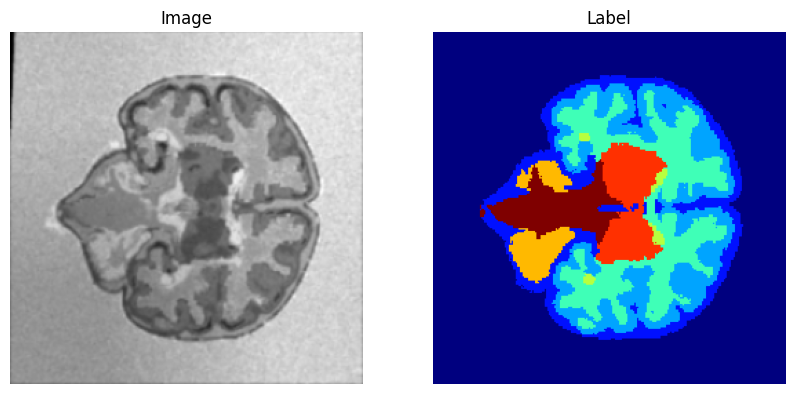

In [2]:


def plot_imgs(data, slice=128):
    # print("Data keys:", data.keys())
    # if 'name' in data:
    #     print("Name:", data['name'])
    print('Generation time:', data['generation_params']['generation_time'])
    # print shape, type, range, device
    print(f"Image shape: {data['image'].shape}, type: {data['image'].dtype}, range: [{data['image'].min()}, {data['image'].max()}], device: {data['image'].device}")
    print(f"Label shape: {data['label'].shape}, type: {data['label'].dtype}, range: [{data['label'].min()}, {data['label'].max()}], device: {data['label'].device}")

    # if cuda tensor, move to cpu
    if data["image"].is_cuda:
        data["image"] = data["image"].cpu()
    if data["label"].is_cuda:
        data["label"] = data["label"].cpu()

    # remove channel dimension
    data["image"] = data["image"].squeeze()
    data["label"] = data["label"].squeeze()

    # plot image label
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(data["image"][:, slice, :], cmap="gray")
    axes[0].set_title("Image")
    axes[0].axis("off")
    axes[1].imshow(data["label"][:, slice, :], cmap='jet')
    axes[1].set_title("Label")
    axes[1].axis("off")
    plt.show()


def squeeze_rotate(img):
    img = img.squeeze().cpu().numpy()
    img = img.transpose(1, 2, 0)
    img = img[::-1,:,:]
    return img

def plot_sidebyside(s1, s2, test_name):
    print(f'Simple image generation time: {s1["generation_params"]["generation_time"]}')
    print(f'{test_name} image generation time: {s2["generation_params"]["generation_time"]}')
    img1, img2 = s1["image"], s2["image"]
    lab1, lab2 = s1["label"], s2["label"]

    img1 = squeeze_rotate(img1)
    img2 = squeeze_rotate(img2)
    lab1 = squeeze_rotate(lab1)
    lab2 = squeeze_rotate(lab2)

    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    axs[0, 0].imshow(img1[:, 128, :], cmap="gray")
    axs[0, 0].set_title("Simple image")
    axs[0, 0].axis("off")
    axs[0, 1].imshow(img2[:, 128, :], cmap="gray")
    axs[0, 1].set_title(f"{test_name} Test image")
    axs[0, 1].axis("off")
    axs[1, 0].imshow(lab1[:, 128, :], cmap="jet")
    axs[1, 0].set_title("Simple label")
    axs[1, 0].axis("off")
    axs[1, 1].imshow(lab2[:, 128, :], cmap="jet")
    axs[1, 1].set_title(f"{test_name} Test label")
    axs[1, 1].axis("off")
    plt.tight_layout()
    plt.show()


intensity_generator = ImageFromSeeds(
    min_subclusters=1,
    max_subclusters=6,
    seed_labels=[ 0, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,
    ],
    generation_classes=[
        0, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,
    ],
    meta_labels=4,
)
spatial_deform = SpatialDeformation(max_rotation=20, max_shear=0.02,max_scaling=0.1,
                                    size=(256, 256, 256), prob=1, nonlinear_transform=True,
                                    nonlin_scale_min=0.03, nonlin_scale_max=0.06,
                                    nonlin_std_max=4, flip_prb=0.5, device='cuda:0')
resampler = RandResample(prob=0.5, max_resolution=1.5, min_resolution=0.5)
bias_field = RandBiasField(prob=0.5, scale_min=0.004, scale_max=0.02, std_min=0.01, std_max=0.3)
noise = RandNoise(prob=0.5, std_min=5, std_max=15)
gamma = RandGamma(prob=0.5, gamma_std=0.1)

simple_synth_gen = generator = FetalSynthGen(shape=(256, 256, 256),
                          resolution=(0.5, 0.5, 0.5),
                          device='cuda:0',
                          intensity_generator=intensity_generator,
                          spatial_deform=spatial_deform,
                          resampler=resampler,
                          bias_field=bias_field,
                          noise=noise,
                          gamma=gamma,
                          )

simple_synth_ds = FetalSynthDataset(
    bids_path="./../data",
    generator=simple_synth_gen,
    seed_path="./../data/derivatives/seeds",
    sub_list=None,
)

for i in range(1):
    for j in range(1):
        plot_imgs(simple_synth_ds.sample_with_meta(j))

Generation time: 1.3938548564910889
Image shape: torch.Size([1, 256, 256, 256]), type: torch.float32, range: [0.0, 1.0], device: cpu
Label shape: torch.Size([1, 256, 256, 256]), type: torch.int64, range: [0, 7], device: cpu


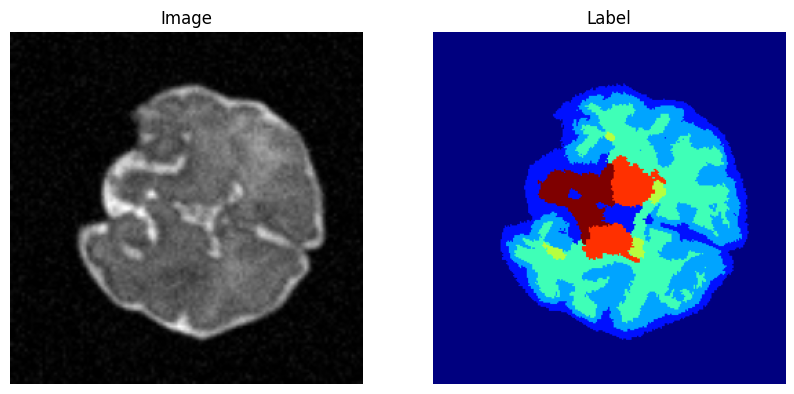

In [3]:
simple_real_ds = FetalSynthDataset(
    bids_path="./../data",
    generator=simple_synth_gen,
    seed_path=None,  # This makes the intensity generator to use the real image
    sub_list=None,
    load_image=True,  # This makes the intensity generator to use the real image
    image_as_intensity=True,  # This makes the intensity generator to use the real image
)
for i in range(1):
    for j in range(1):
        plot_imgs(simple_real_ds.sample_with_meta(j))

In [4]:
from fetalsyngen.generator.augmentation.artifacts import (
    BlurCortex,
    StructNoise,
    SimulateMotion,
    SimulatedBoundaries,
)
from fetalsyngen.generator.artifacts.utils import ScannerParams, ReconParams

## Cortex Blur

Simple image generation time: 1.455979824066162
Blur Cortex image generation time: 0.9514014720916748


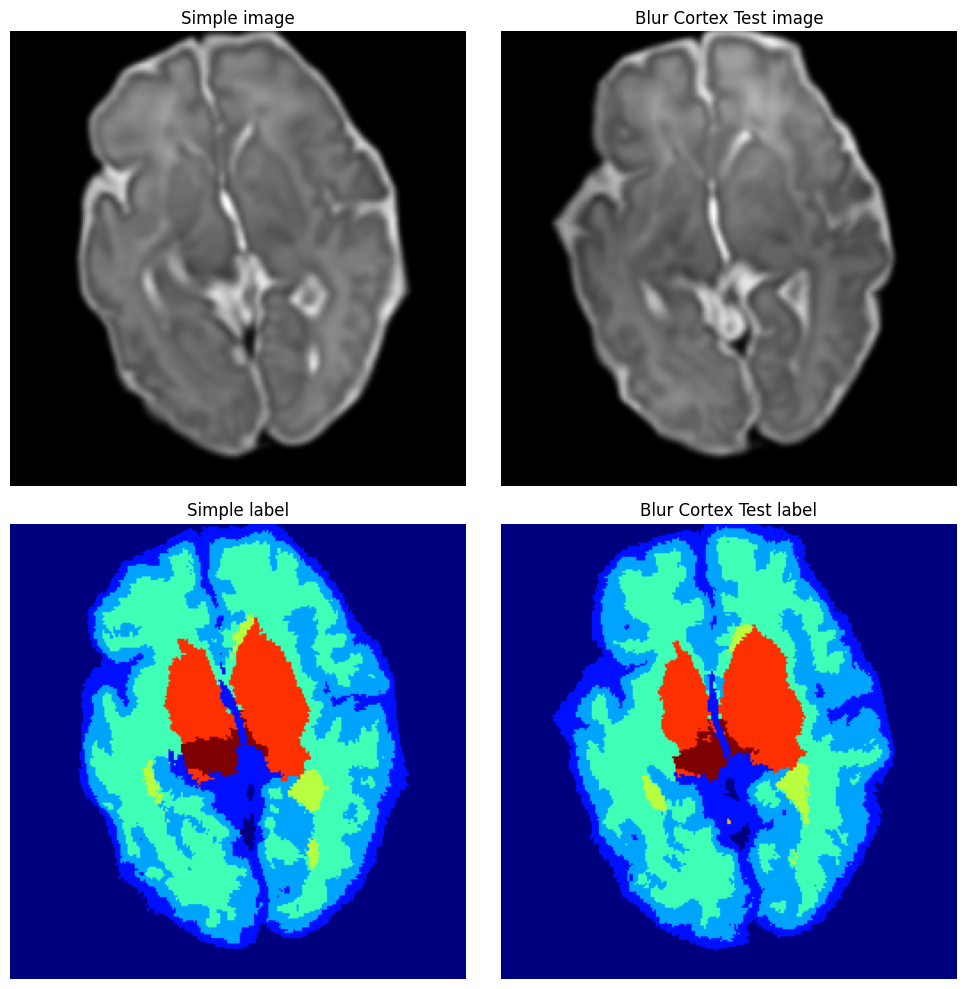

Simple image generation time: 0.6283080577850342
Blur Cortex image generation time: 1.0965125560760498


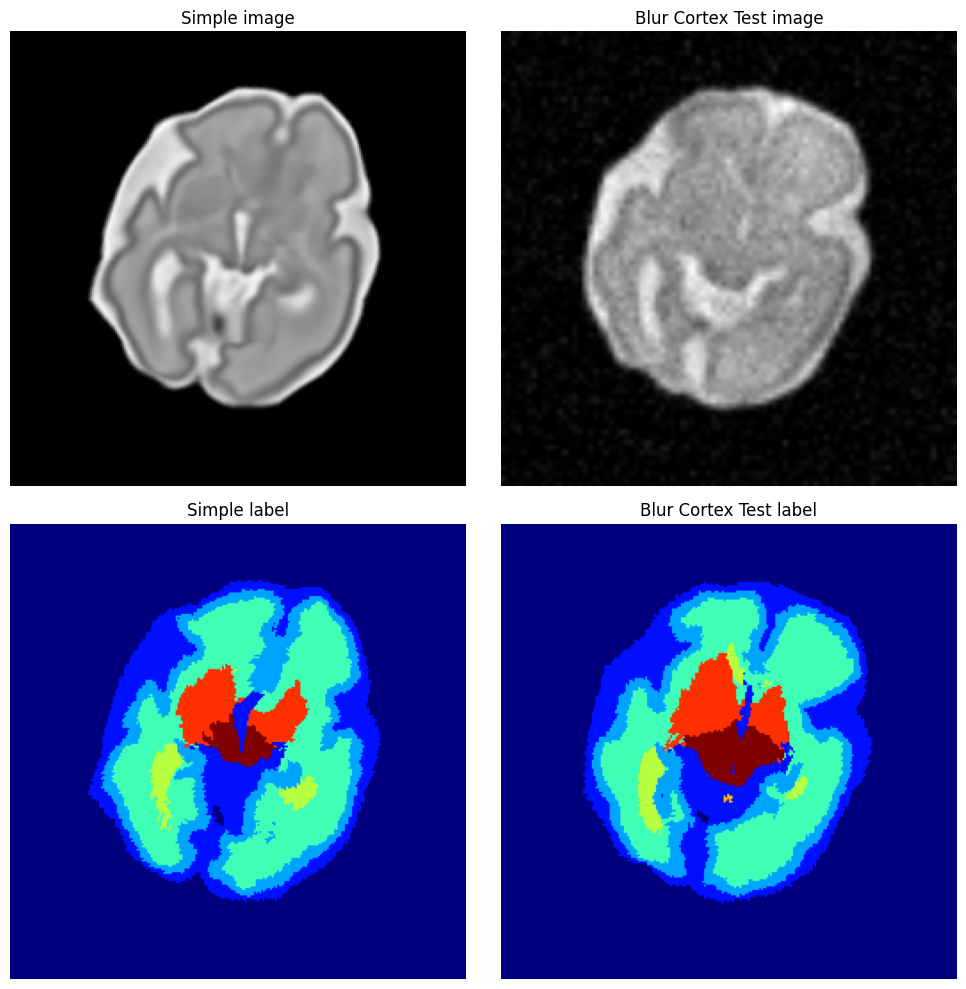

Simple image generation time: 0.6661884784698486
Blur Cortex image generation time: 1.7596046924591064


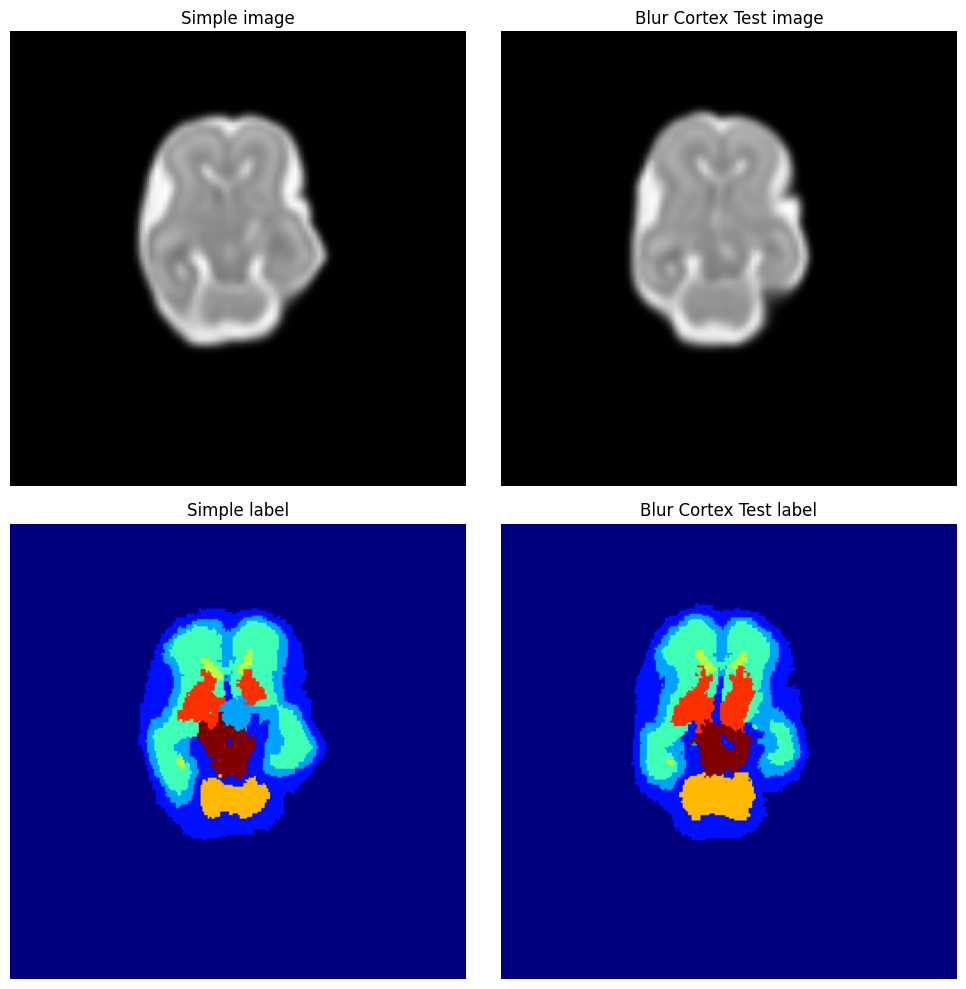

Simple image generation time: 1.1641366481781006
Blur Cortex image generation time: 1.097292423248291


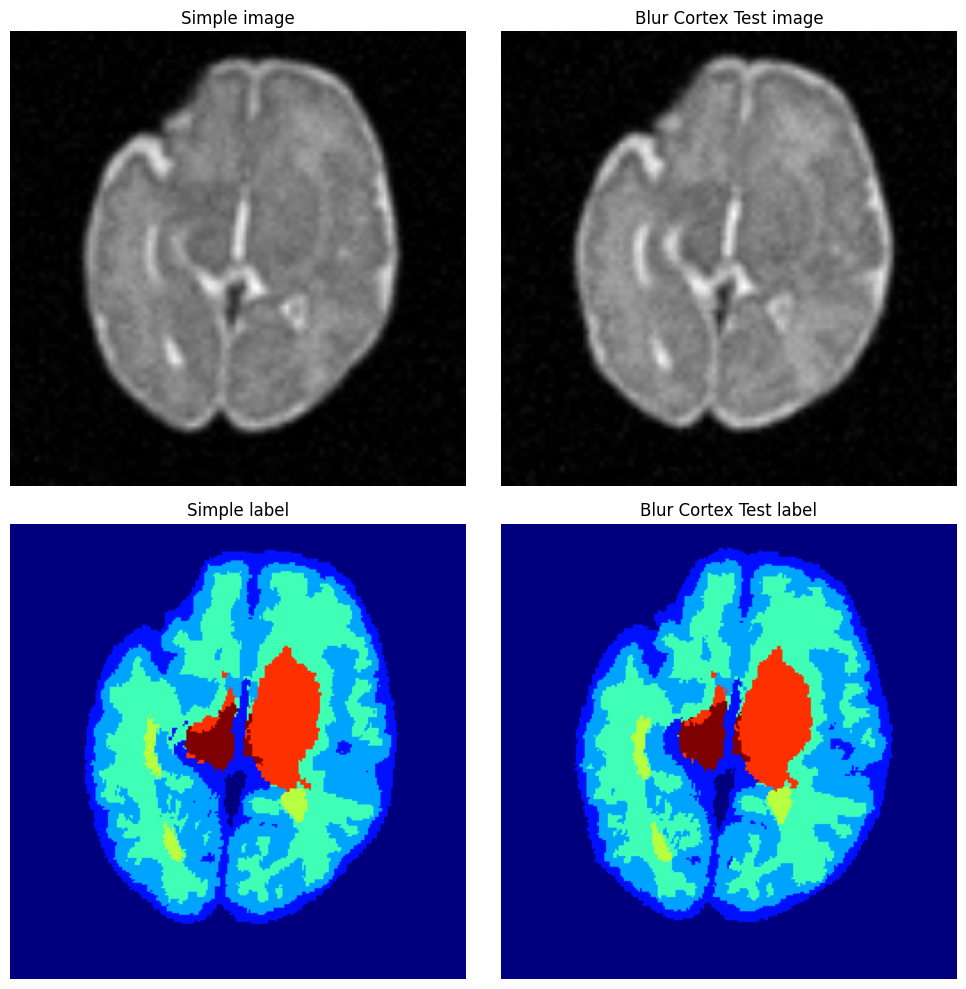

Simple image generation time: 0.7115678787231445
Blur Cortex image generation time: 1.2761938571929932


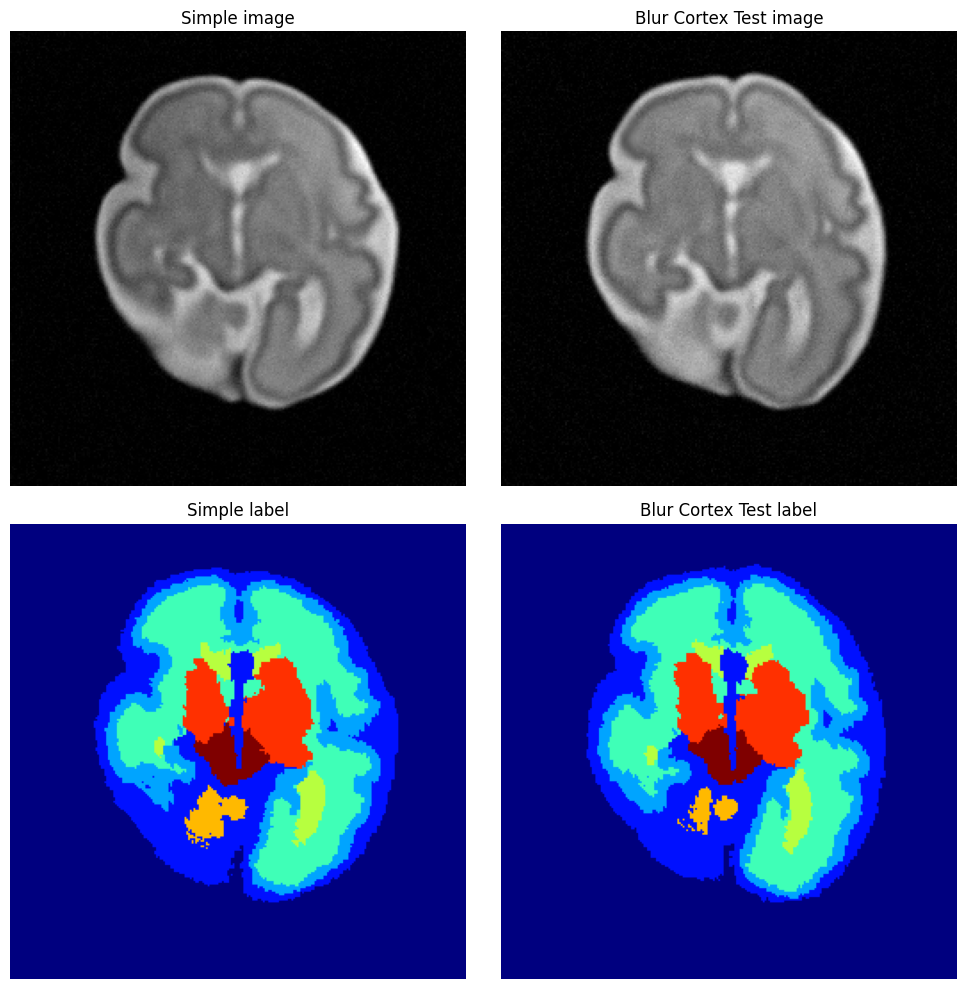

Simple image generation time: 0.4721970558166504
Blur Cortex image generation time: 1.820263385772705


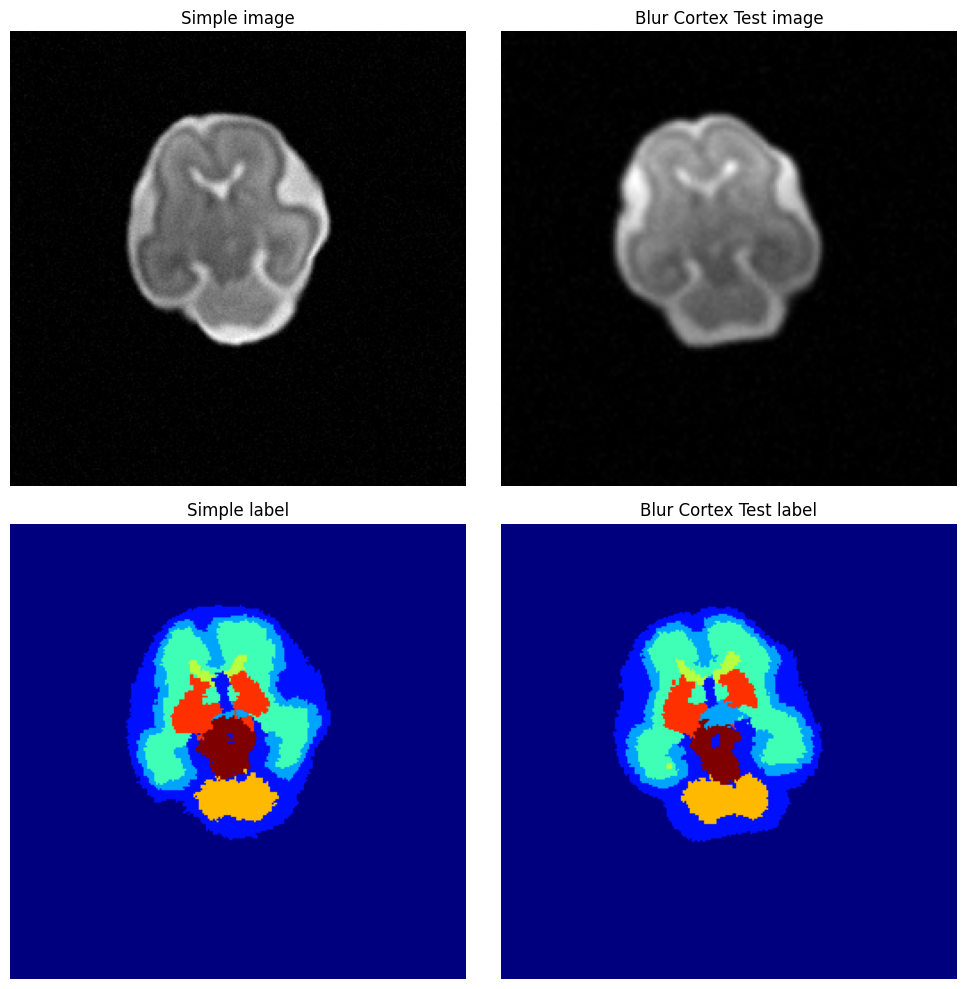

Simple image generation time: 0.6139764785766602
Blur Cortex image generation time: 1.5382556915283203


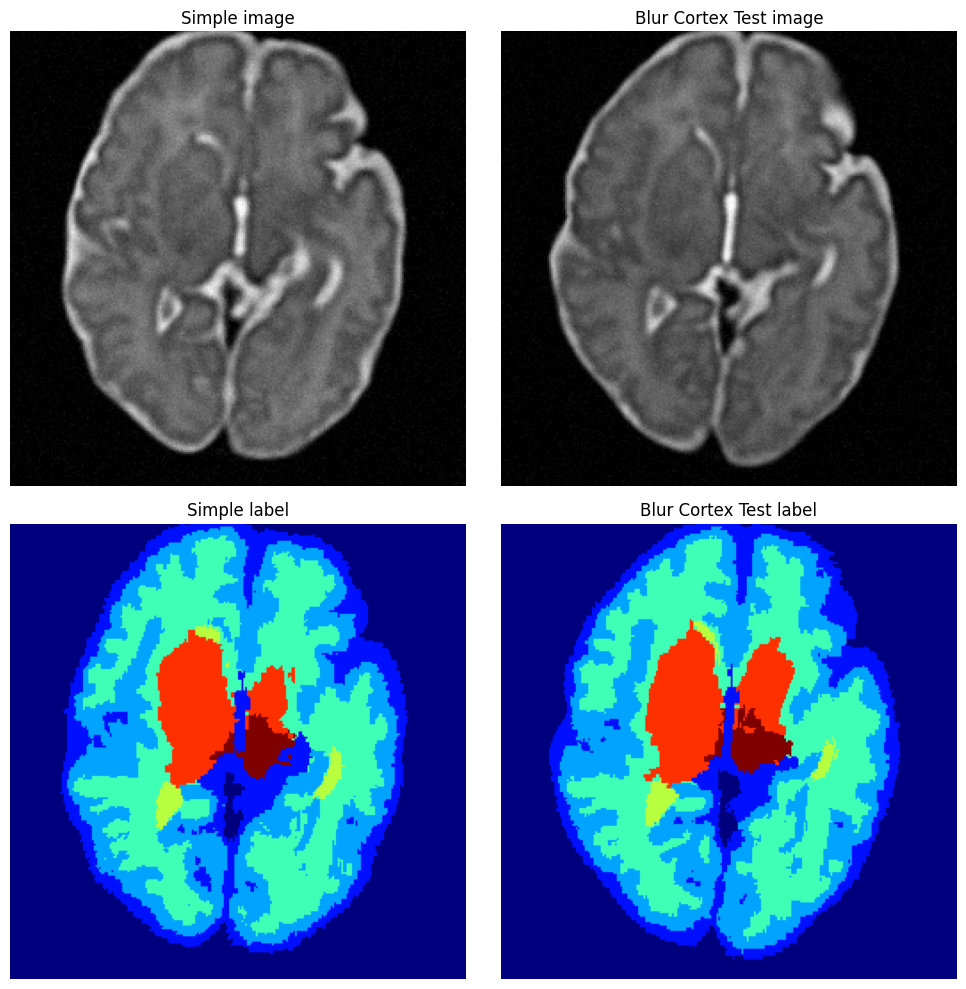

Simple image generation time: 0.5360660552978516
Blur Cortex image generation time: 1.46126127243042


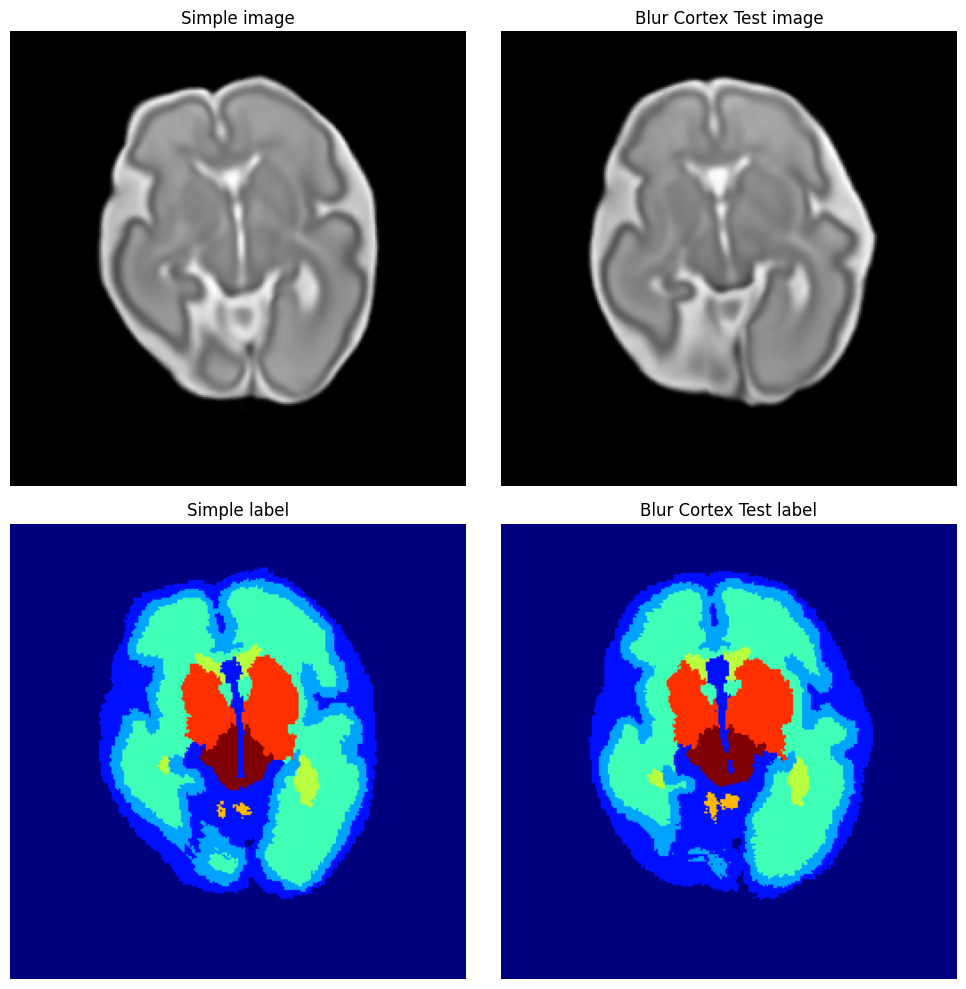

Simple image generation time: 0.2944784164428711
Blur Cortex image generation time: 1.0842430591583252


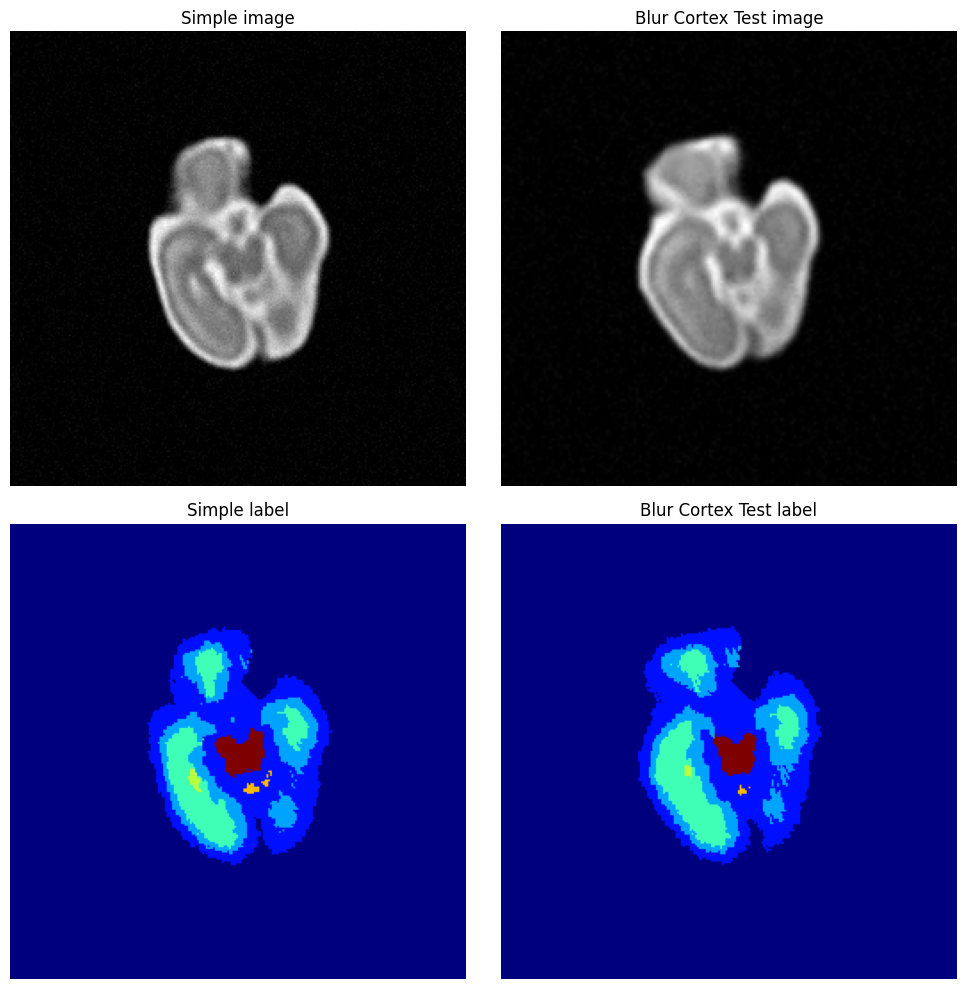

In [5]:
# SR ARTIFACTS CLASSES
import nibabel as nib
# Instantiate BlurCortex
test_name = 'Blur Cortex'
blur_cortex = BlurCortex(
    prob=1,
    cortex_label=2,
    nblur_min=50,
    nblur_max=200,
    sigma_gamma_loc=3,
    sigma_gamma_scale=1,
    std_blur_shape=2,
    std_blur_scale=1,
)

test_gen = FetalSynthGen(
    intensity_generator=None,
    shape=(256, 256, 256),
    resolution=(0.5, 0.5, 0.5),
    device="cuda:0",
    # intensity_generator=intensity_generator,
    spatial_deform=spatial_deform,
    resampler=resampler,
    bias_field=bias_field,
    noise=noise,
    gamma=gamma,
    blur_cortex=blur_cortex,
)

test_dataset = FetalSynthDataset(
    bids_path="./../data",
    generator=test_gen,
    seed_path=None,
    load_image=True,
    image_as_intensity=True,
    sub_list=None,
)


for j in range(3):
    for i in range(3):
        simple_sample = simple_real_ds.sample_with_meta(i)
        test_sample = test_dataset.sample_with_meta(
            i, simple_sample["generation_params"]
        )

        plot_sidebyside(simple_sample, test_sample, test_name)
        og_im = simple_sample["image"].squeeze().cpu().numpy()
        te_im = test_sample["image"].squeeze().cpu().numpy()
        #nib.save(nib.Nifti1Image(og_im, np.eye(4)), f'og_im_{3*j+i+1}.nii.gz')
        #nib.save(nib.Nifti1Image(te_im, np.eye(4)), f"te_im_{3*j+i+1}.nii.gz")

## Struct Noise

Simple image generation time: 0.8098175525665283
StructNoise image generation time: 0.6894650459289551


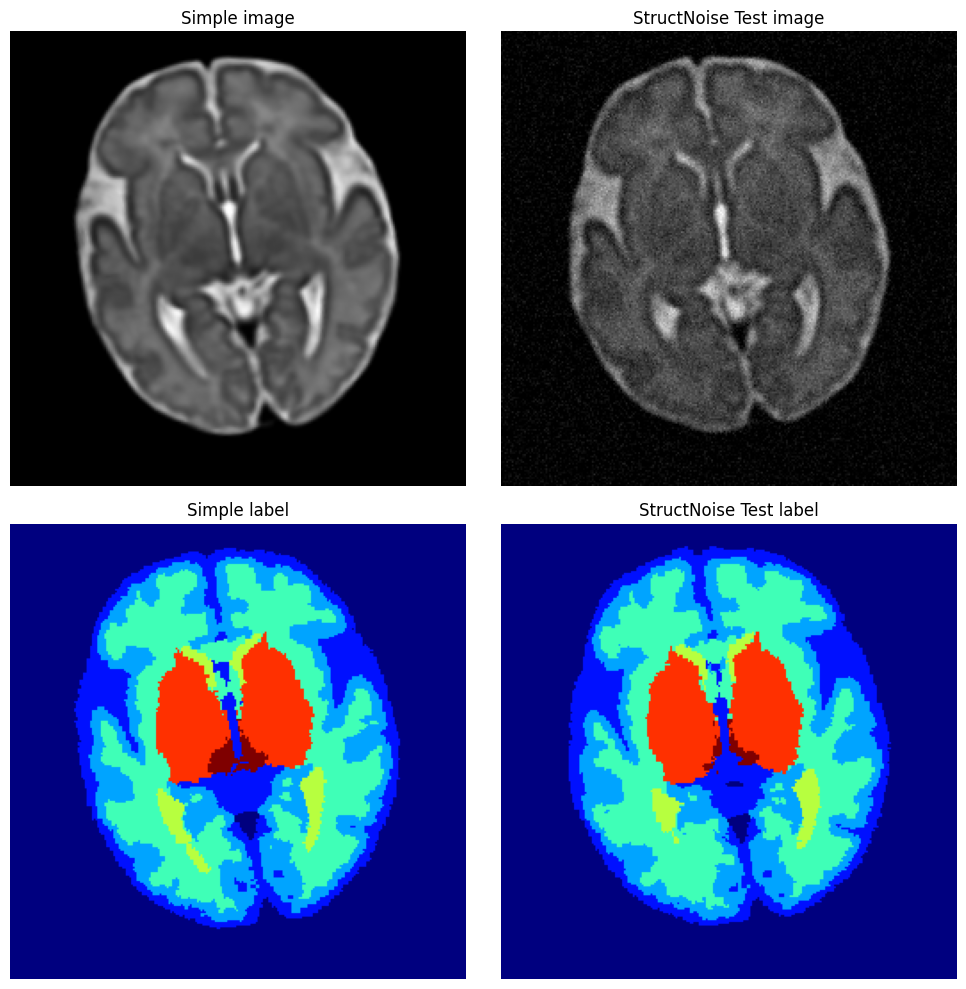

Simple image generation time: 0.5206124782562256
StructNoise image generation time: 0.9422481060028076


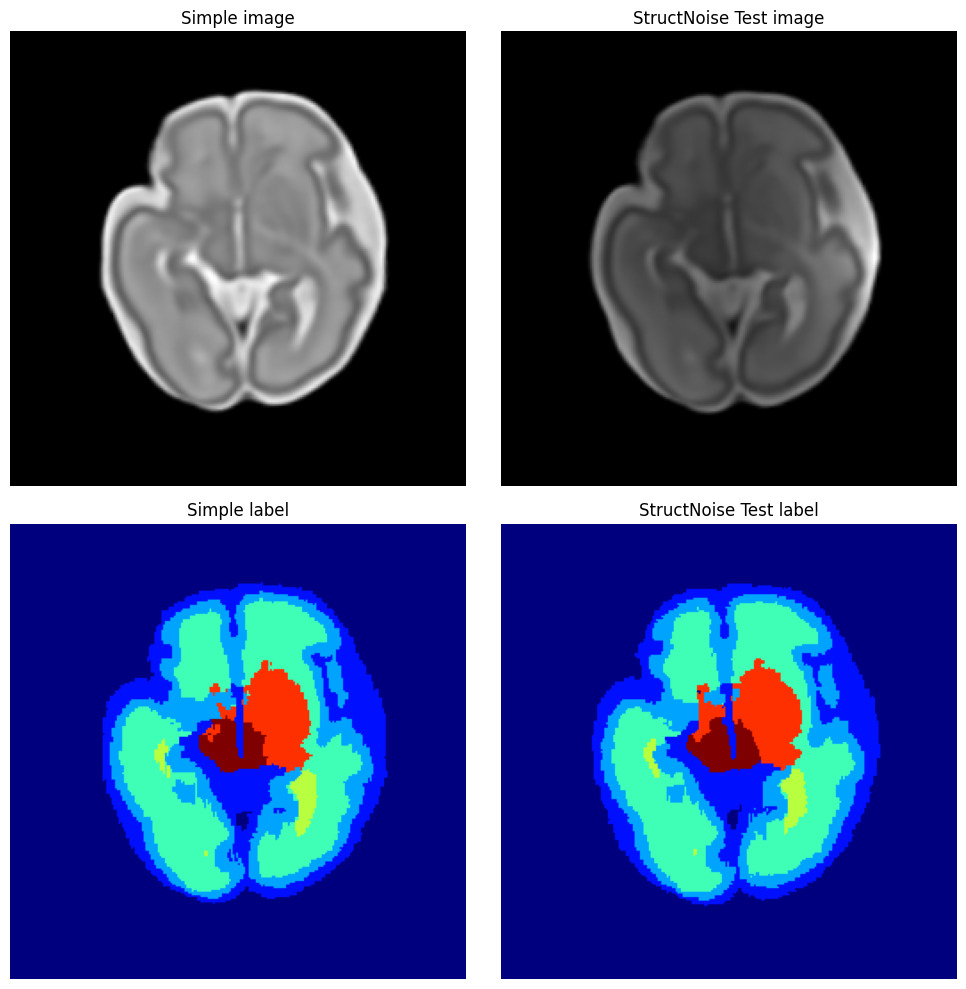

Simple image generation time: 0.547260046005249
StructNoise image generation time: 0.4529149532318115


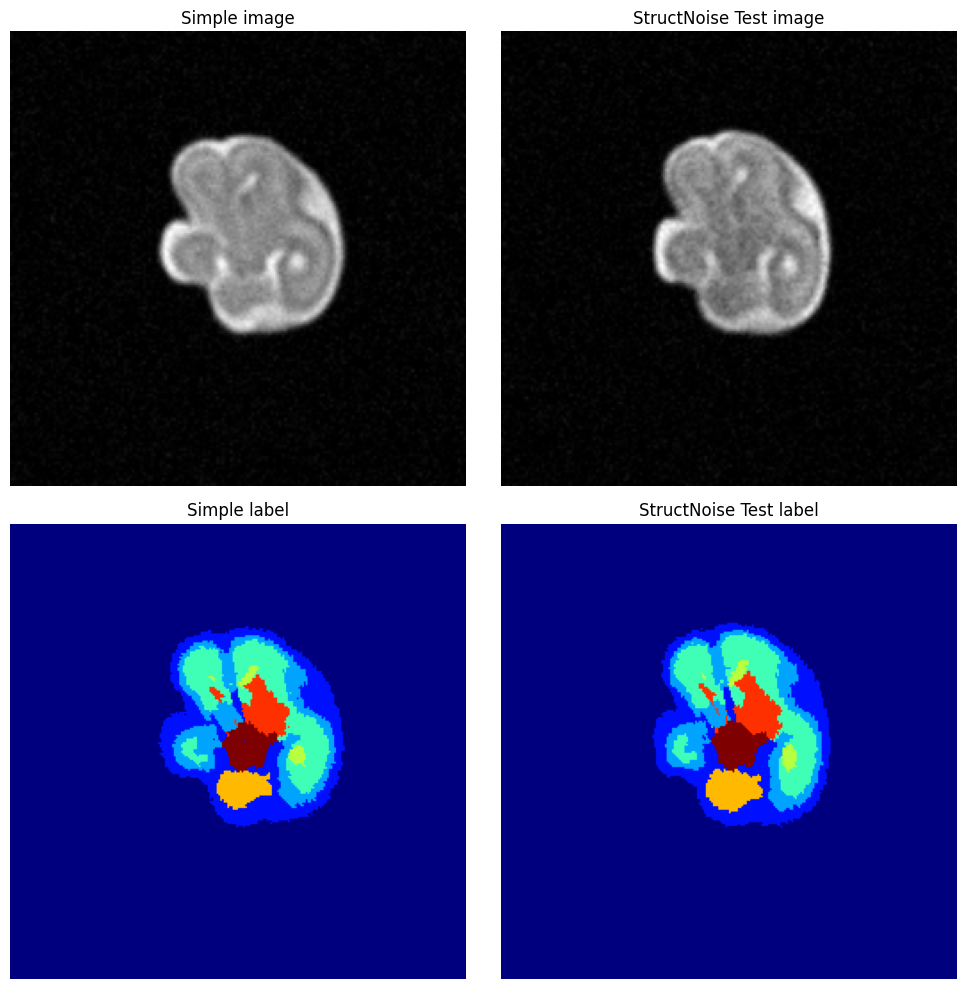

Simple image generation time: 0.3952505588531494
StructNoise image generation time: 0.42916011810302734


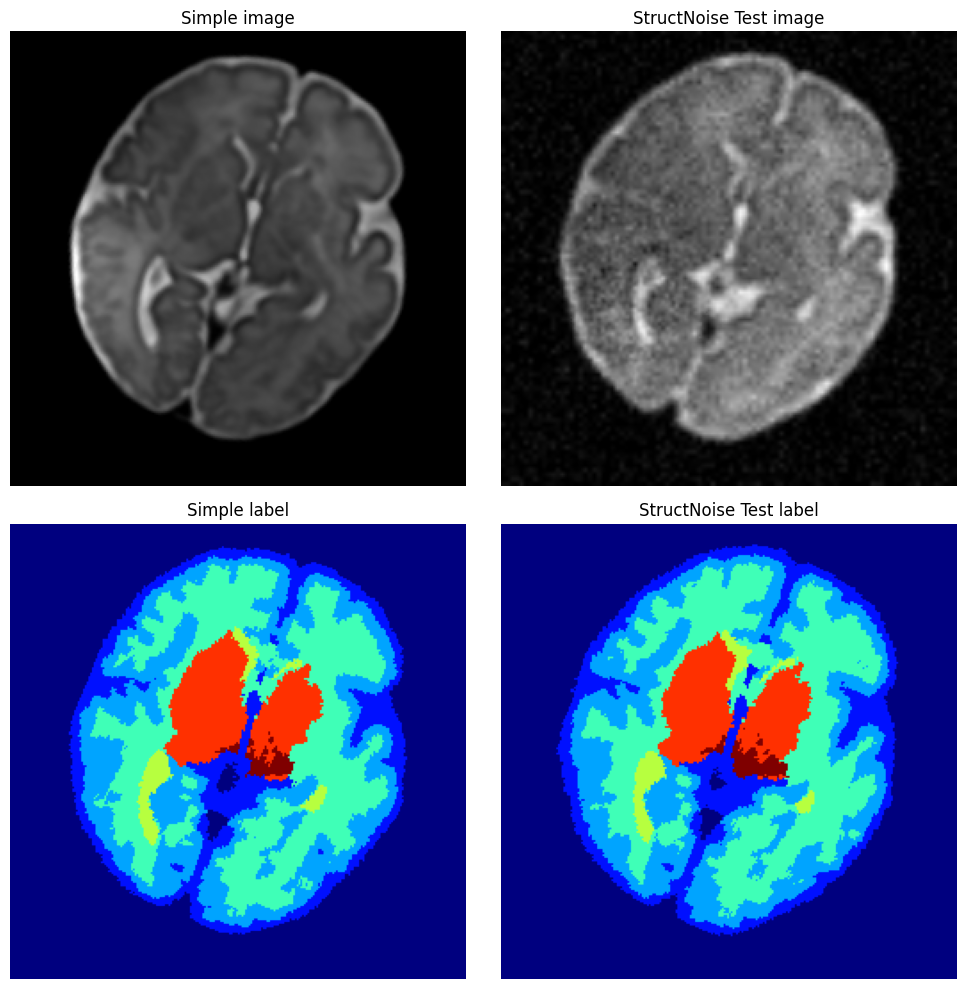

Simple image generation time: 0.2674074172973633
StructNoise image generation time: 0.3702707290649414


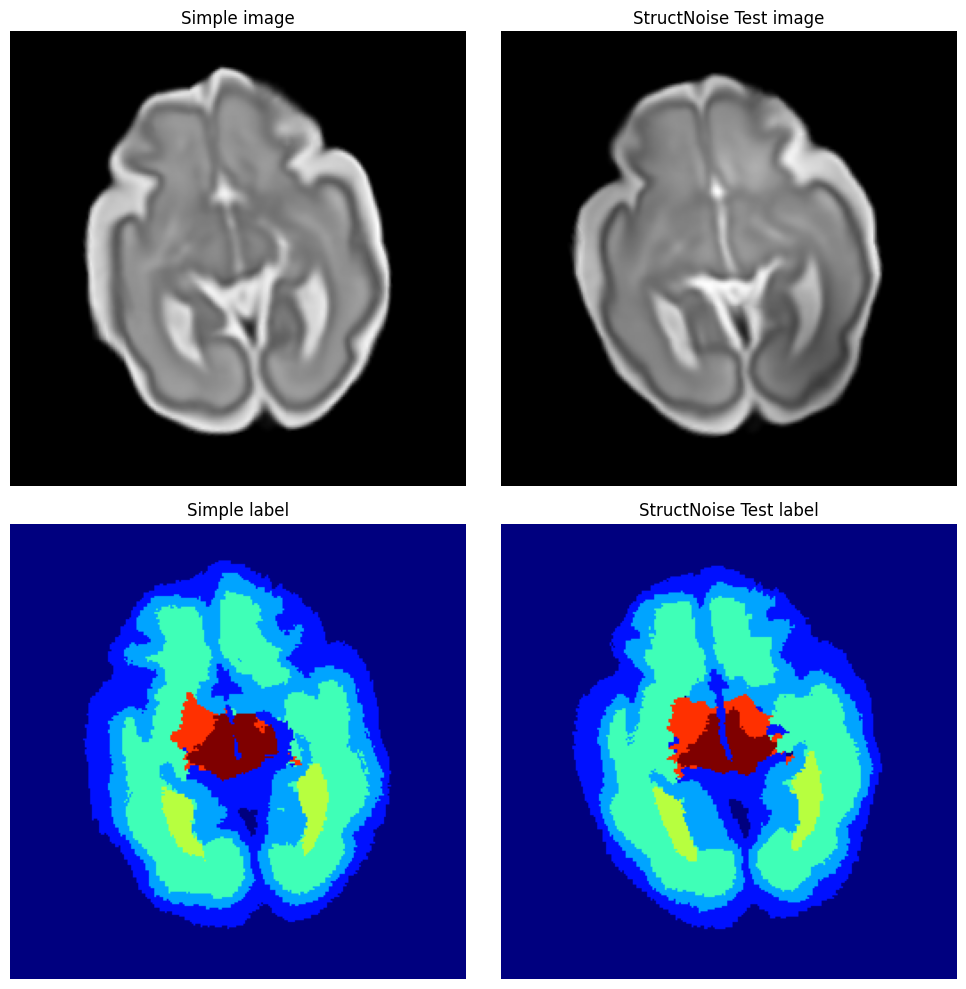

Simple image generation time: 0.37448835372924805
StructNoise image generation time: 0.9912300109863281


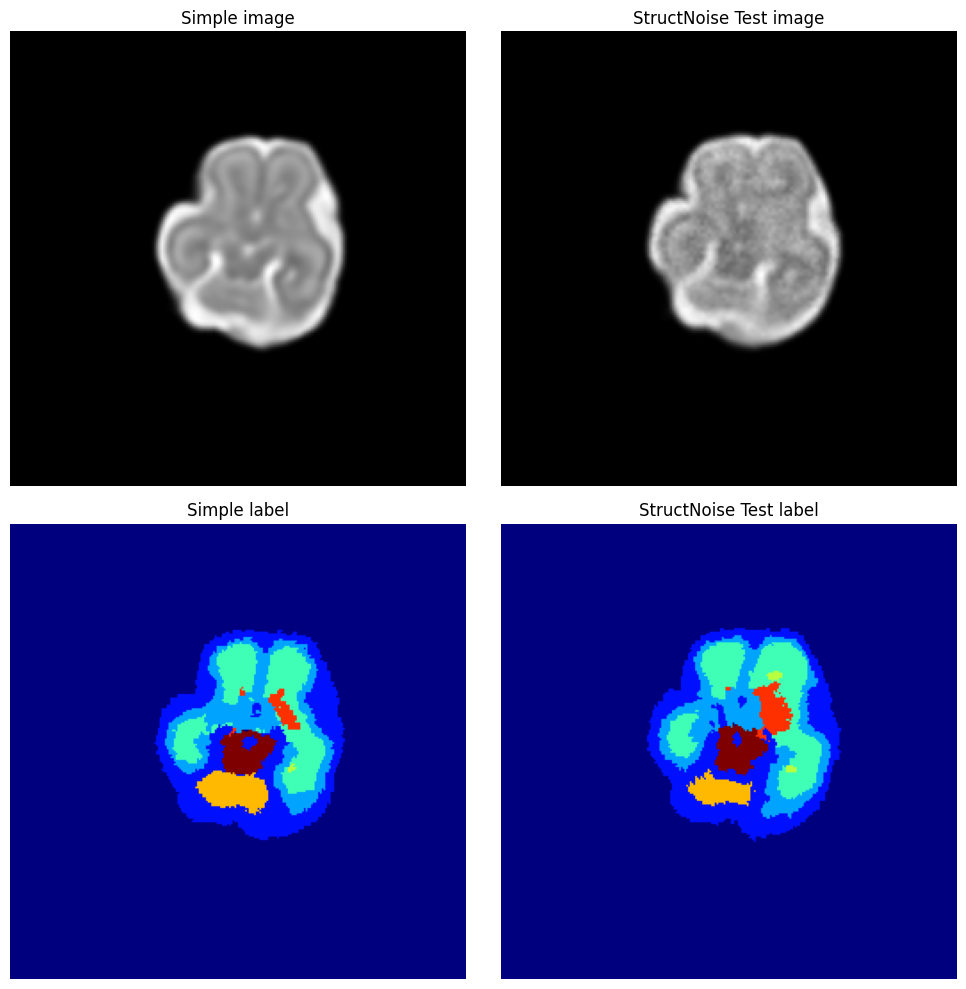

Simple image generation time: 0.6127946376800537
StructNoise image generation time: 1.064436912536621


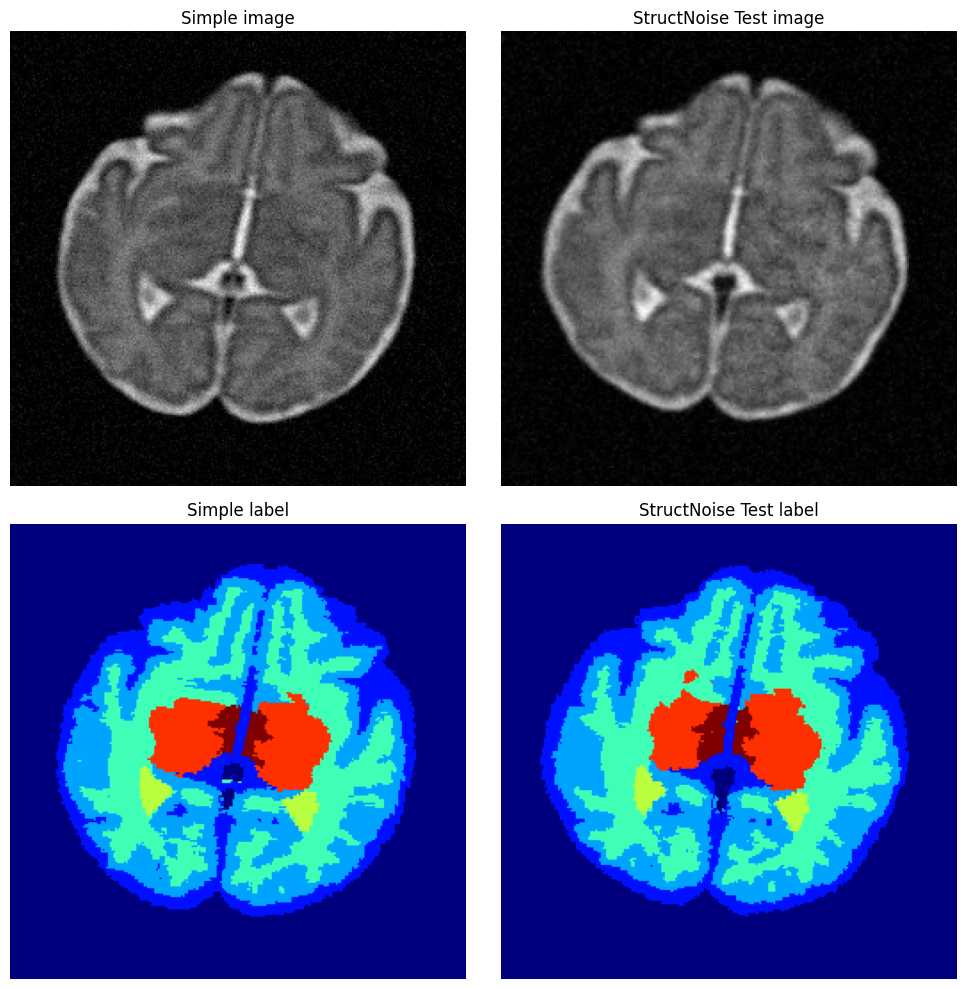

Simple image generation time: 1.2996888160705566
StructNoise image generation time: 1.0621392726898193


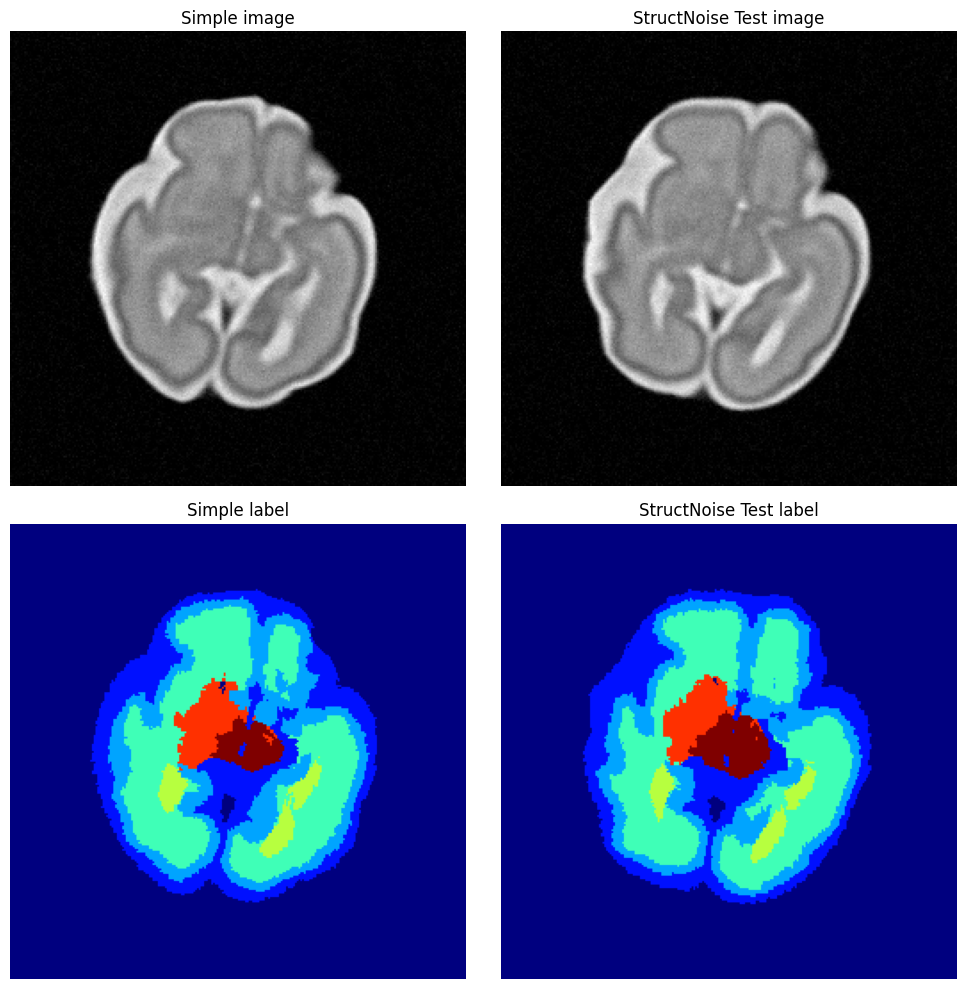

Simple image generation time: 0.9849598407745361
StructNoise image generation time: 0.9391324520111084


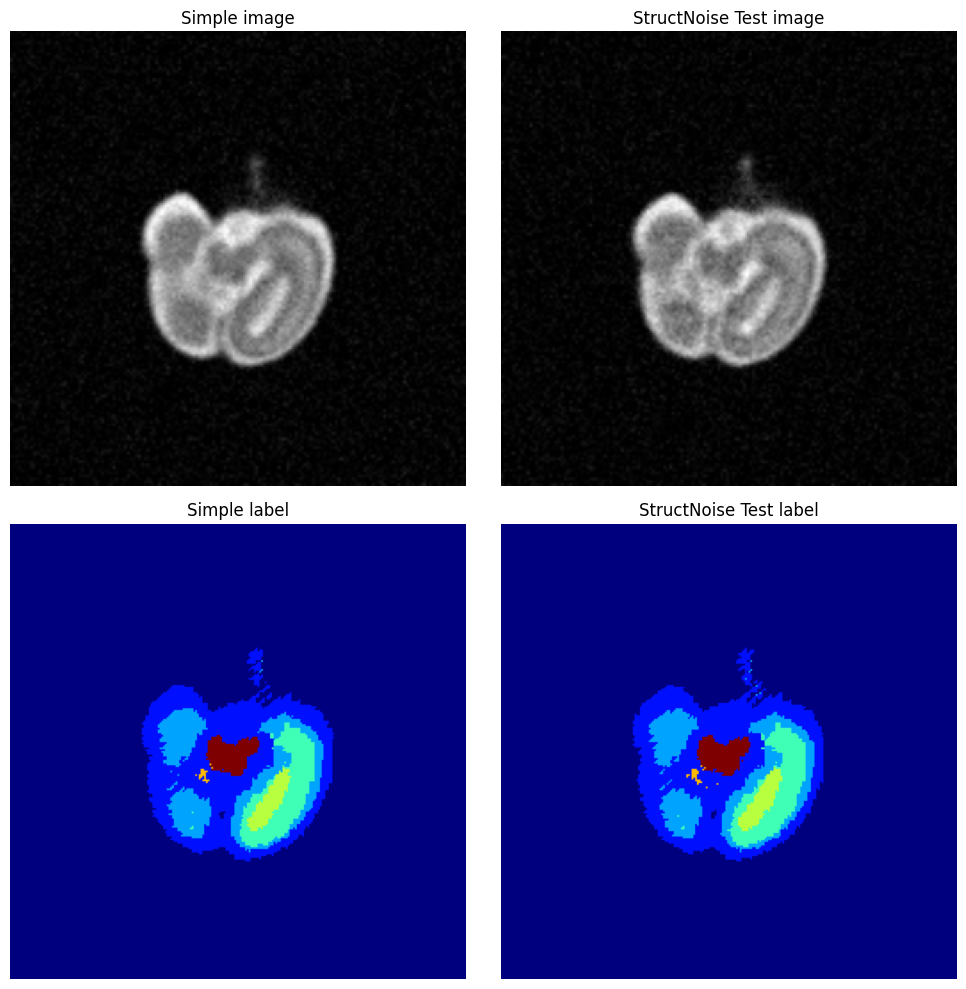

In [6]:
# SR ARTIFACTS CLASSES

# Instantiate BlurCortex
test_name = "StructNoise"
# Instantiate StructNoise
struct_noise = StructNoise(
    prob=1, wm_label=3, std_min=0.2, std_max=0.3, nloc_min=5, nloc_max=10
)

test_gen = FetalSynthGen(
    intensity_generator=None,
    shape=(256, 256, 256),
    resolution=(0.5, 0.5, 0.5),
    device="cuda:0",
    # intensity_generator=intensity_generator,
    spatial_deform=spatial_deform,
    resampler=resampler,
    bias_field=bias_field,
    noise=noise,
    gamma=gamma,
    struct_noise=struct_noise,
)

test_dataset = FetalSynthDataset(
    bids_path="./../data",
    generator=test_gen,
    seed_path=None,
    load_image=True,
    image_as_intensity=True,
    sub_list=None,
)

for j in range(3):
    for i in range(3):
        simple_sample = simple_real_ds.sample_with_meta(i)
        test_sample = test_dataset.sample_with_meta(
            i, simple_sample["generation_params"]
        )

        plot_sidebyside(simple_sample, test_sample, test_name)

## SimBoundaries

Simple image generation time: 0.4901609420776367
SimulatedBoundaries image generation time: 1.0296366214752197


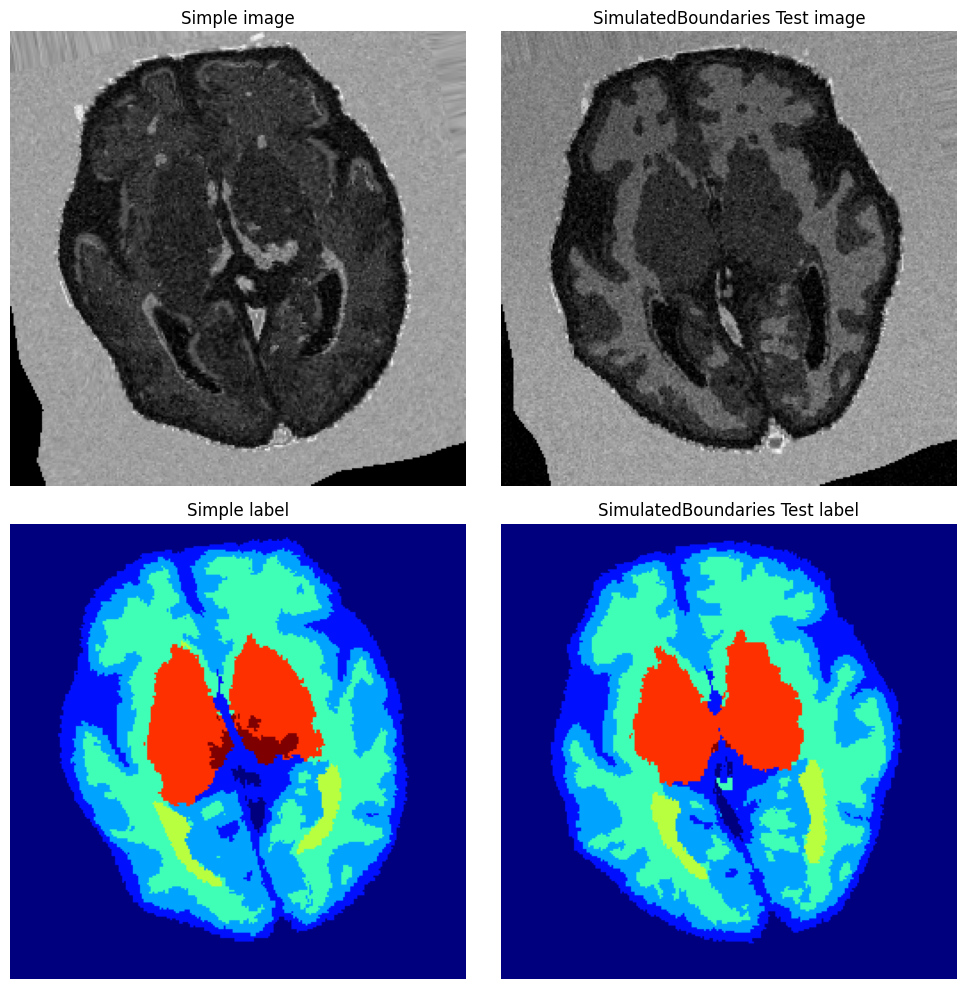

Simple image generation time: 0.7788748741149902
SimulatedBoundaries image generation time: 21.752742767333984


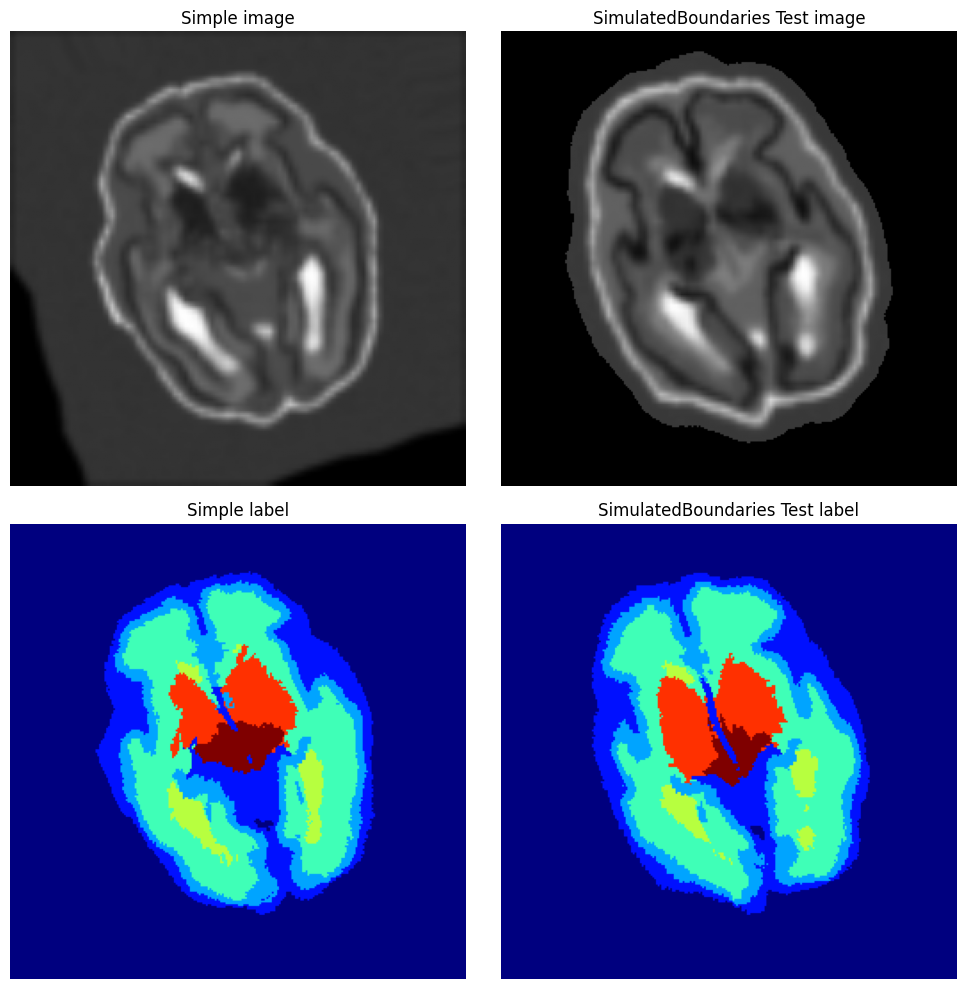

Simple image generation time: 0.5801892280578613
SimulatedBoundaries image generation time: 0.32378315925598145


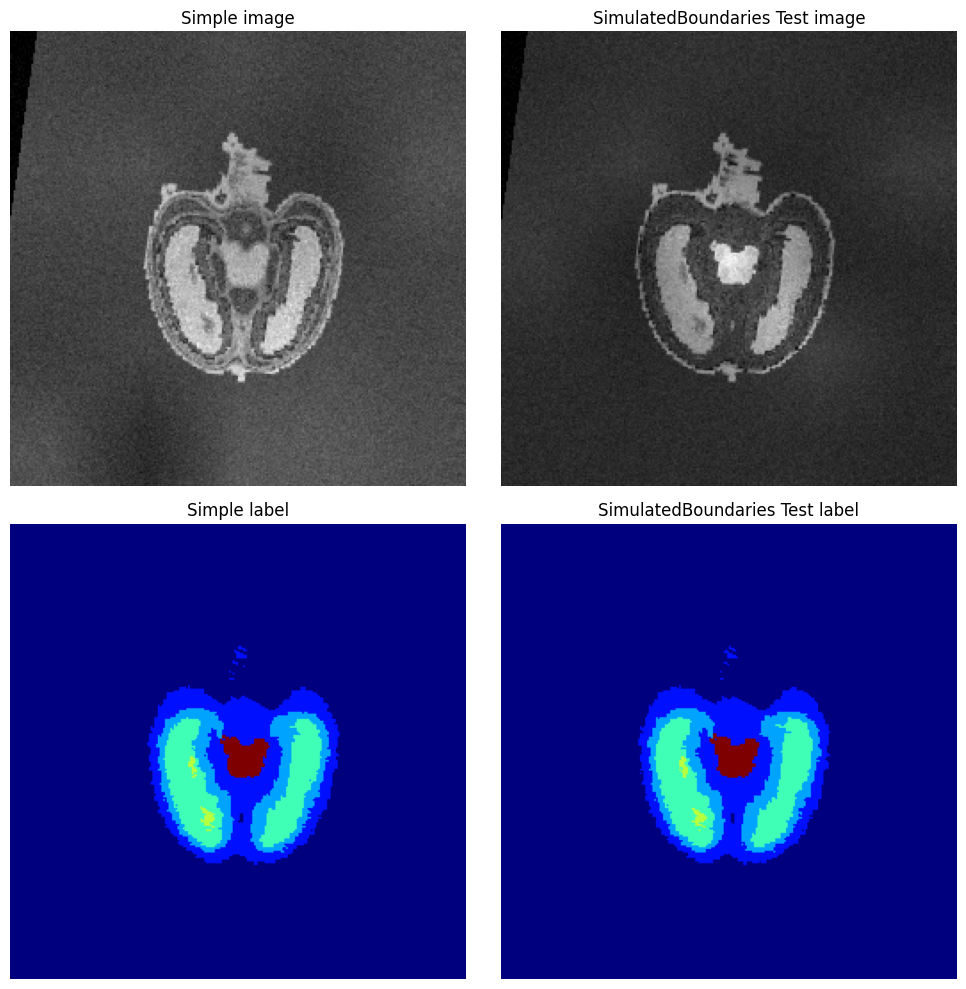

Simple image generation time: 1.8643240928649902
SimulatedBoundaries image generation time: 0.9429068565368652


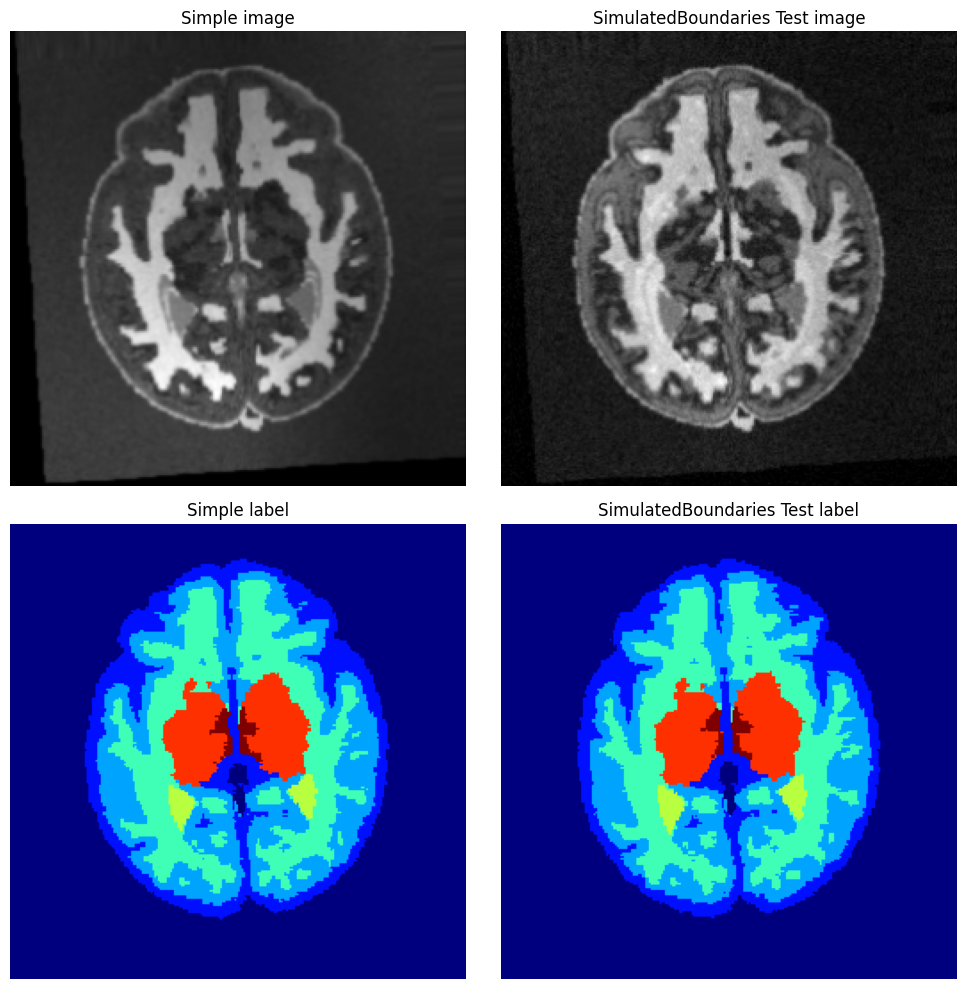

Simple image generation time: 0.6017041206359863
SimulatedBoundaries image generation time: 4.662397384643555


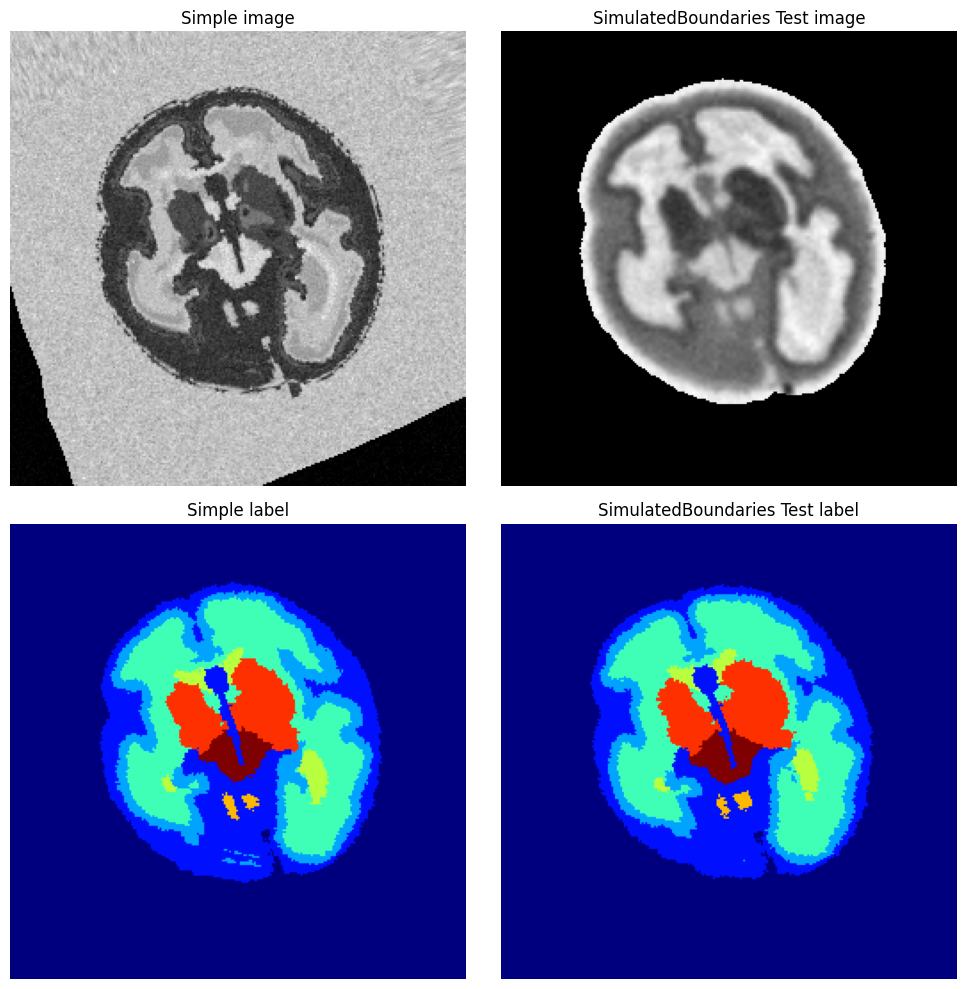

Simple image generation time: 0.659703254699707
SimulatedBoundaries image generation time: 1.1904876232147217


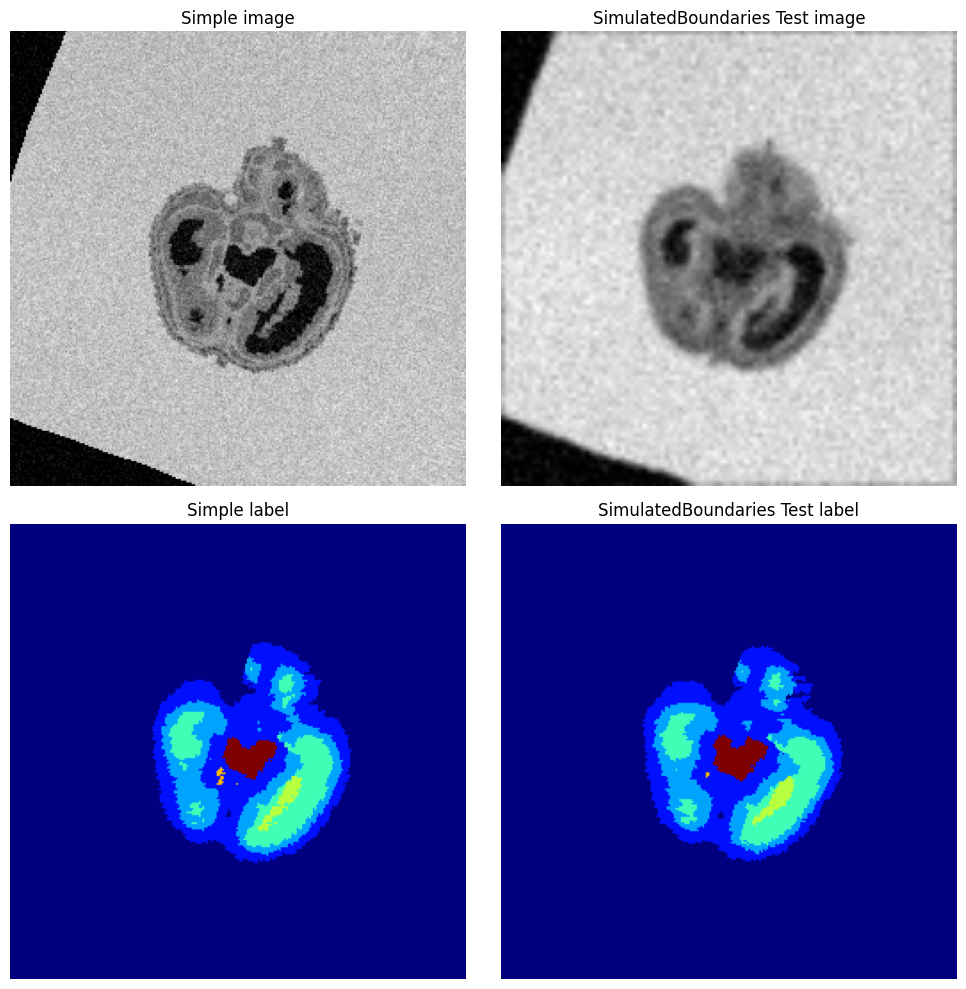

Simple image generation time: 1.0150609016418457
SimulatedBoundaries image generation time: 4.542985439300537


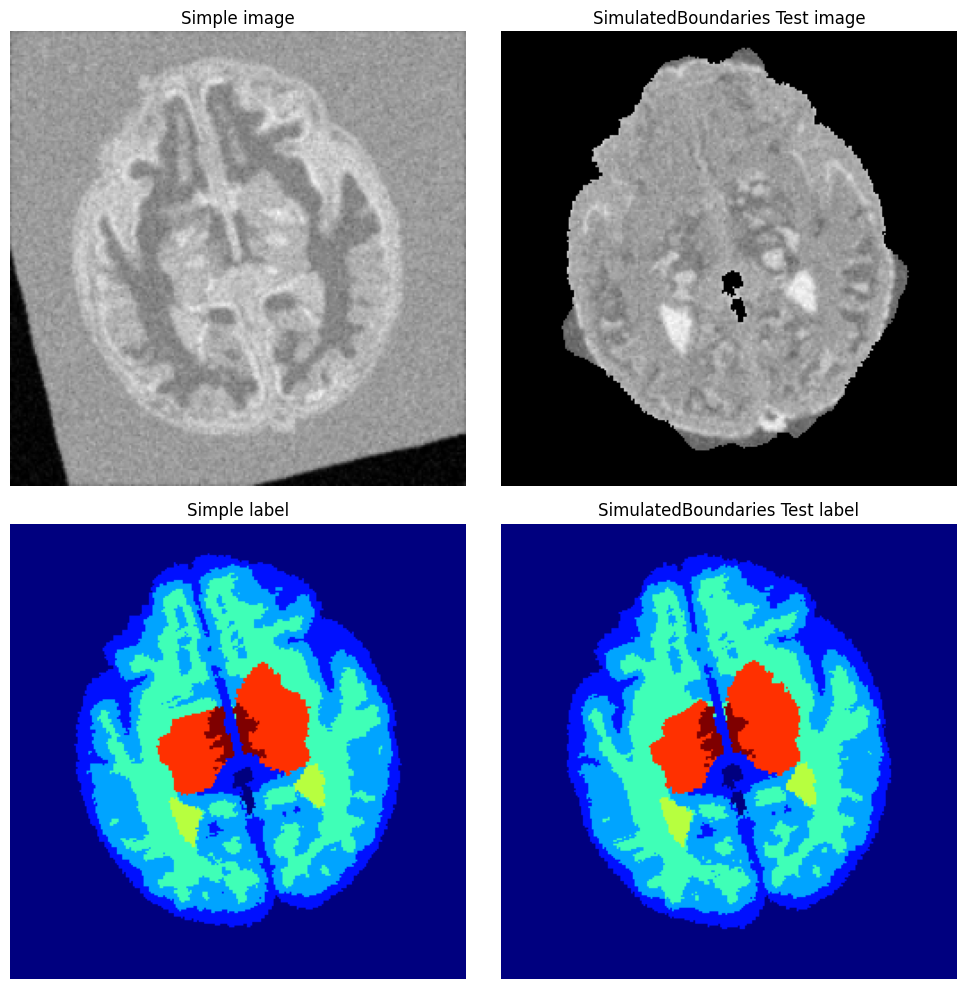

Simple image generation time: 0.6149561405181885
SimulatedBoundaries image generation time: 3.4415087699890137


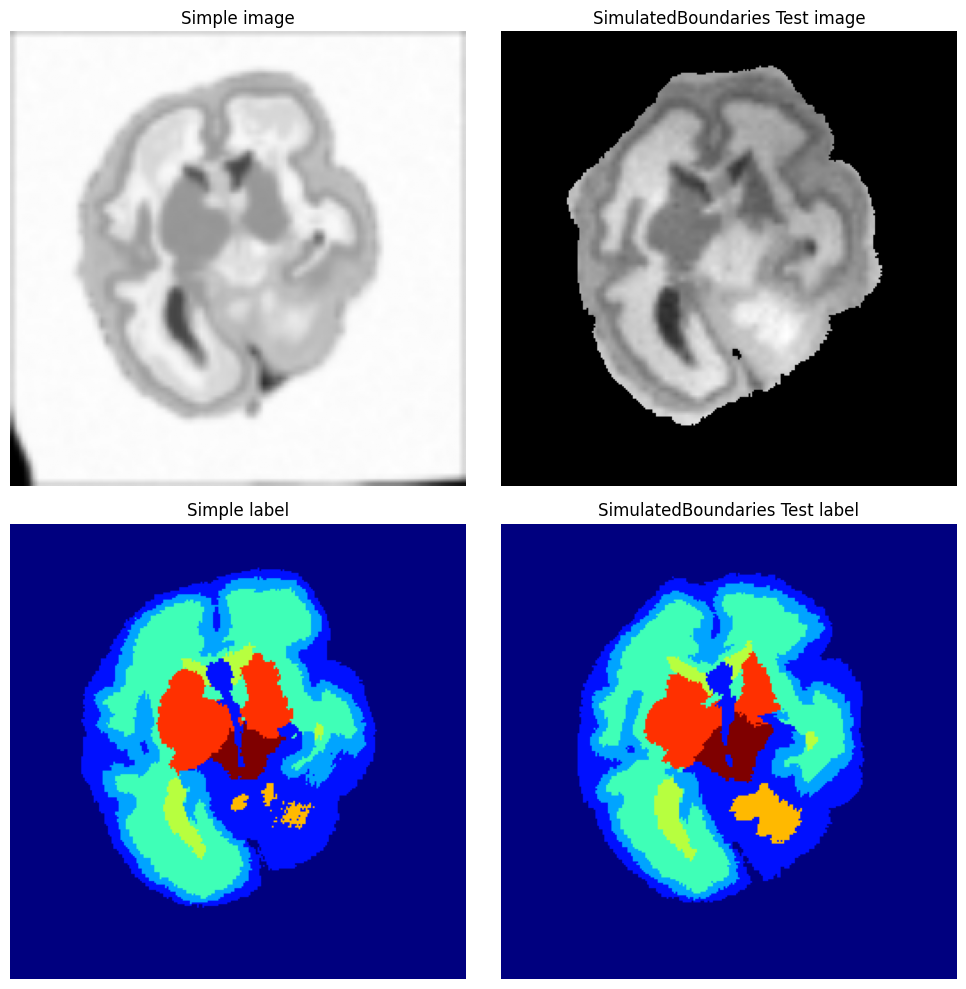

Simple image generation time: 0.5164687633514404
SimulatedBoundaries image generation time: 1.1690113544464111


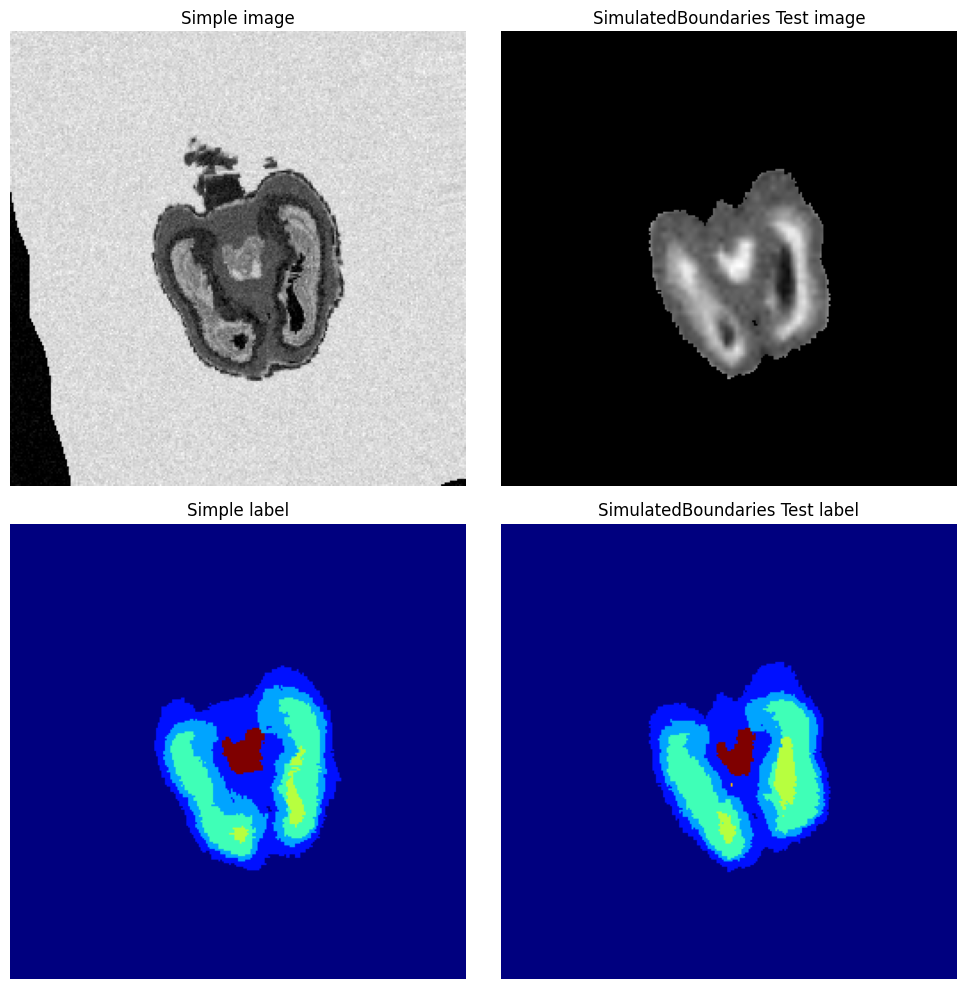

In [7]:
# SR ARTIFACTS CLASSES

# Instantiate BlurCortex
test_name = "SimulatedBoundaries"
# Instantiate SimulatedBoundaries
boundaries = SimulatedBoundaries(
    prob_no_mask=0.5, prob_if_mask_halo=0.5, prob_if_mask_fuzzy=0.5
)
test_gen = FetalSynthGen(
    shape=(256, 256, 256),
    resolution=(0.5, 0.5, 0.5),
    device="cuda:0",
    intensity_generator=intensity_generator,
    spatial_deform=spatial_deform,
    resampler=resampler,
    bias_field=bias_field,
    noise=noise,
    gamma=gamma,
    boundaries=boundaries,
)

test_dataset = FetalSynthDataset(
    bids_path="./../data",
    generator=test_gen,
    seed_path='./../data/derivatives/seeds',
    load_image=False,
    image_as_intensity=False,
    sub_list=None,
)

for j in range(3):
    for i in range(3):
        simple_sample = simple_synth_ds.sample_with_meta(i)
        test_sample = test_dataset.sample_with_meta(
            i, simple_sample["generation_params"]
        )

        plot_sidebyside(simple_sample, test_sample, test_name)

## SimulateMotion

1 {'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.6930879179432915, 'slice_thickness': 4.026002706057679, 'gap': 2.943136212611156, 'nstacks': 3, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [True, False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 2}}
Simple image generation time: 0.881627082824707
SimulateMotion image generation time: 3.167707681655884


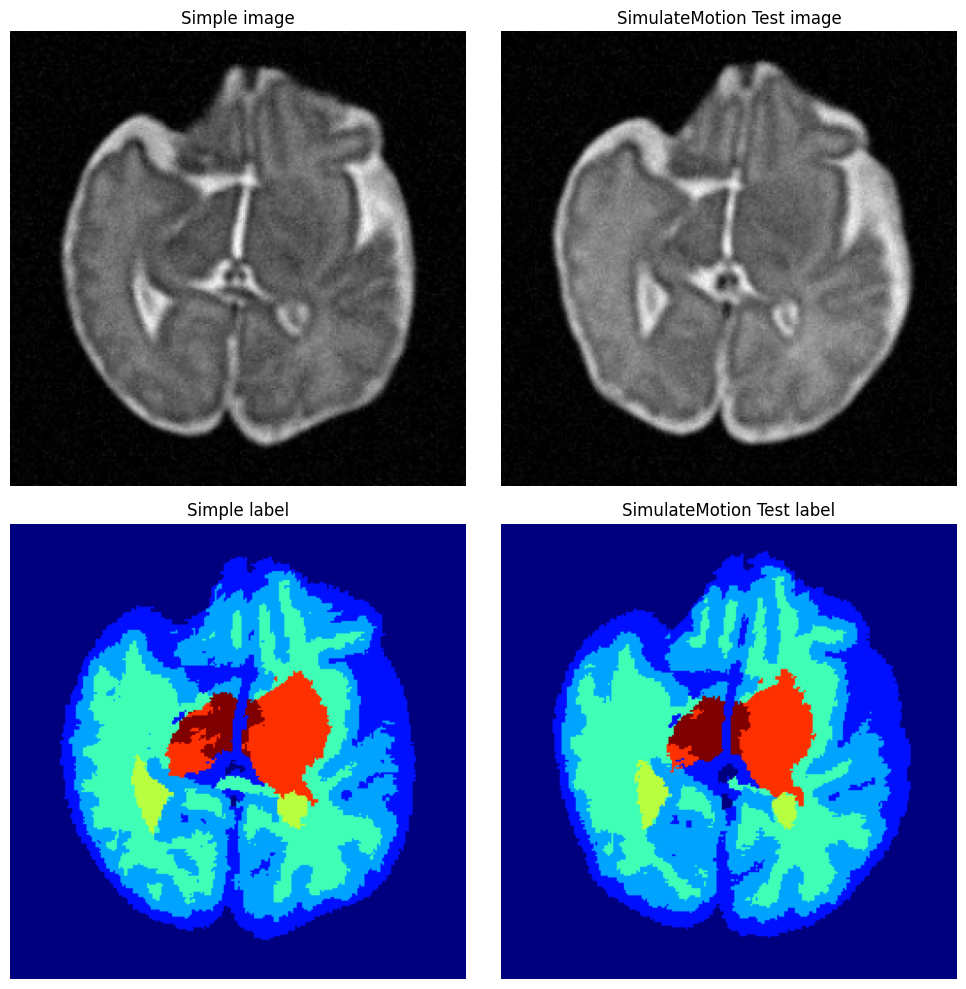

2 {'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.2805049447190039, 'slice_thickness': 2.035020809357361, 'gap': 2.4209757076355274, 'nstacks': 3, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, False, False], 'misreg_slice_on': False, 'merge_volume_on': False, 'ngaussians_merge': 2}}
Simple image generation time: 0.4969520568847656
SimulateMotion image generation time: 1.1930179595947266


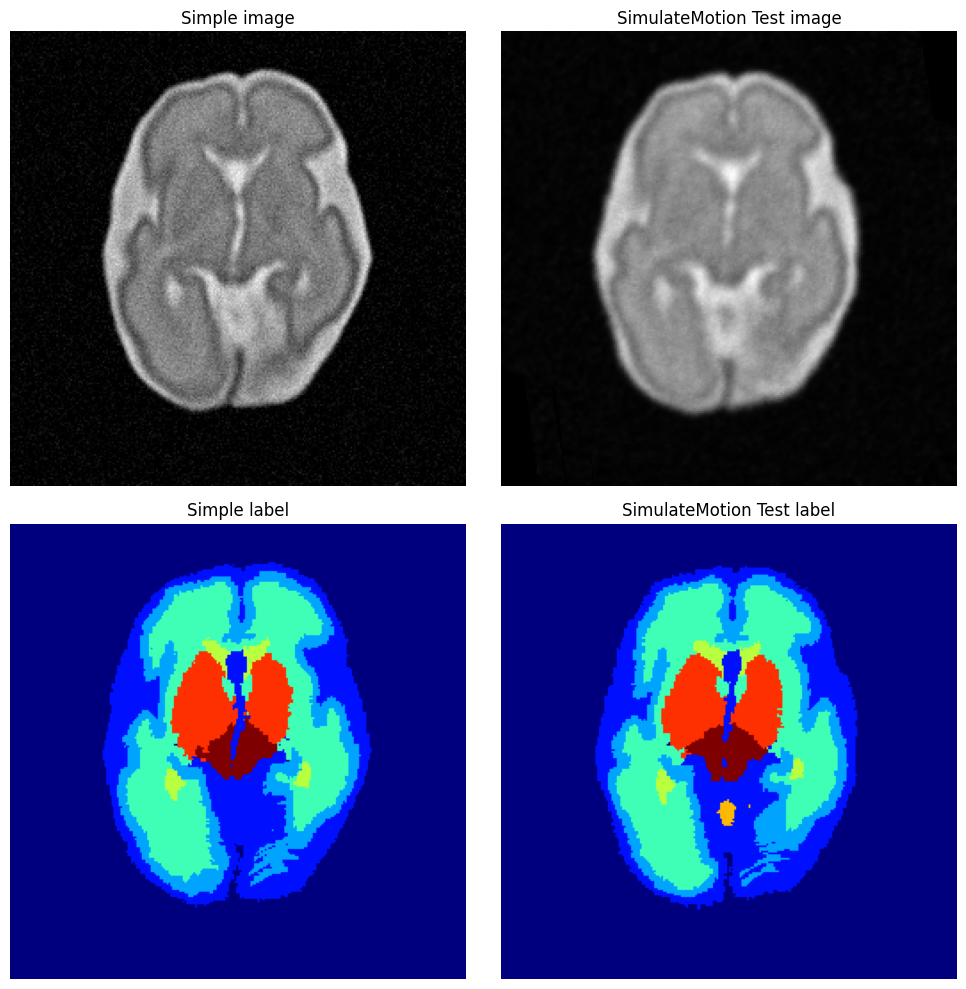

3 {'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.36047363587899567, 'slice_thickness': 2.667164296947561, 'gap': 3.1132840934352015, 'nstacks': 5, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, False, False, False, True], 'misreg_slice_on': False, 'merge_volume_on': False, 'ngaussians_merge': 3}}
Simple image generation time: 1.2042620182037354
SimulateMotion image generation time: 1.3423142433166504


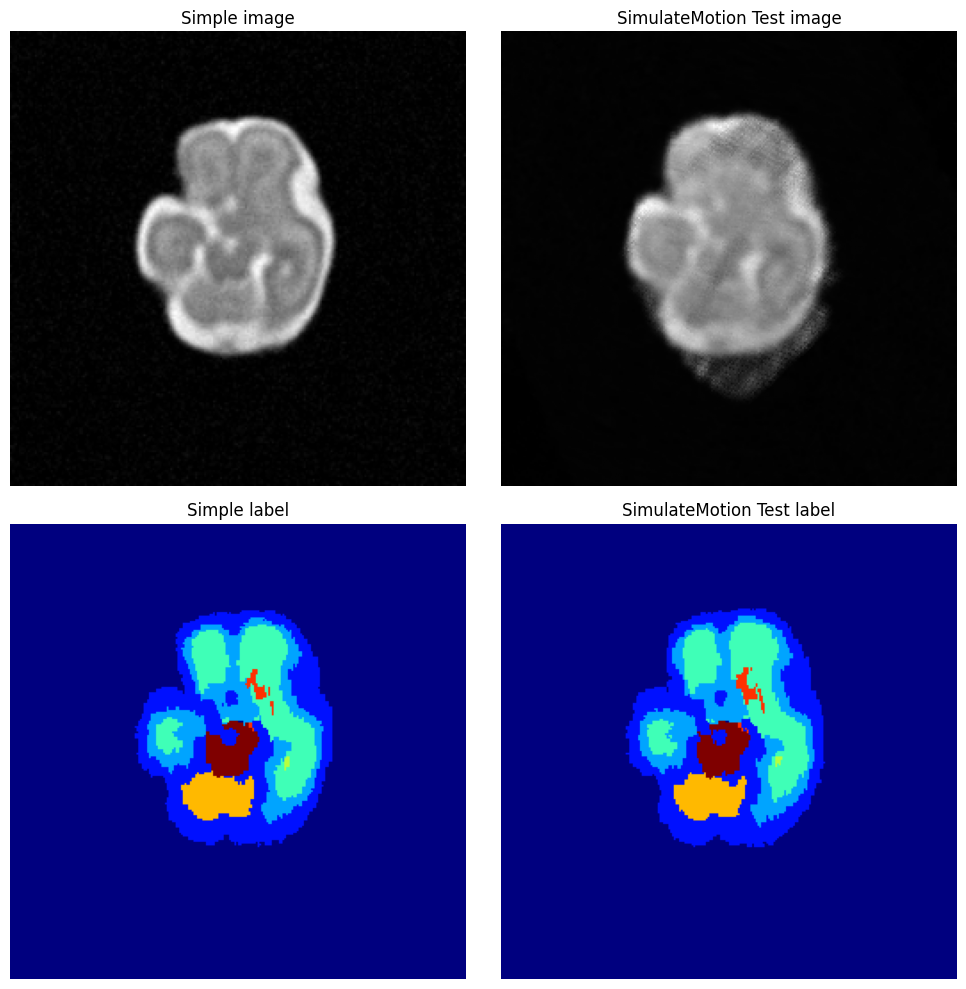

4 {'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.2629282023111481, 'slice_thickness': 2.4687408299202644, 'gap': 3.055808403066219, 'nstacks': 4, 'smooth_volume_on': False, 'rm_slices_on': True, 'rm_slices_ratio': 0.11748297422545131, 'misreg_stack_on': [False, False, False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 2}}
Simple image generation time: 0.6072473526000977
SimulateMotion image generation time: 1.0871386528015137


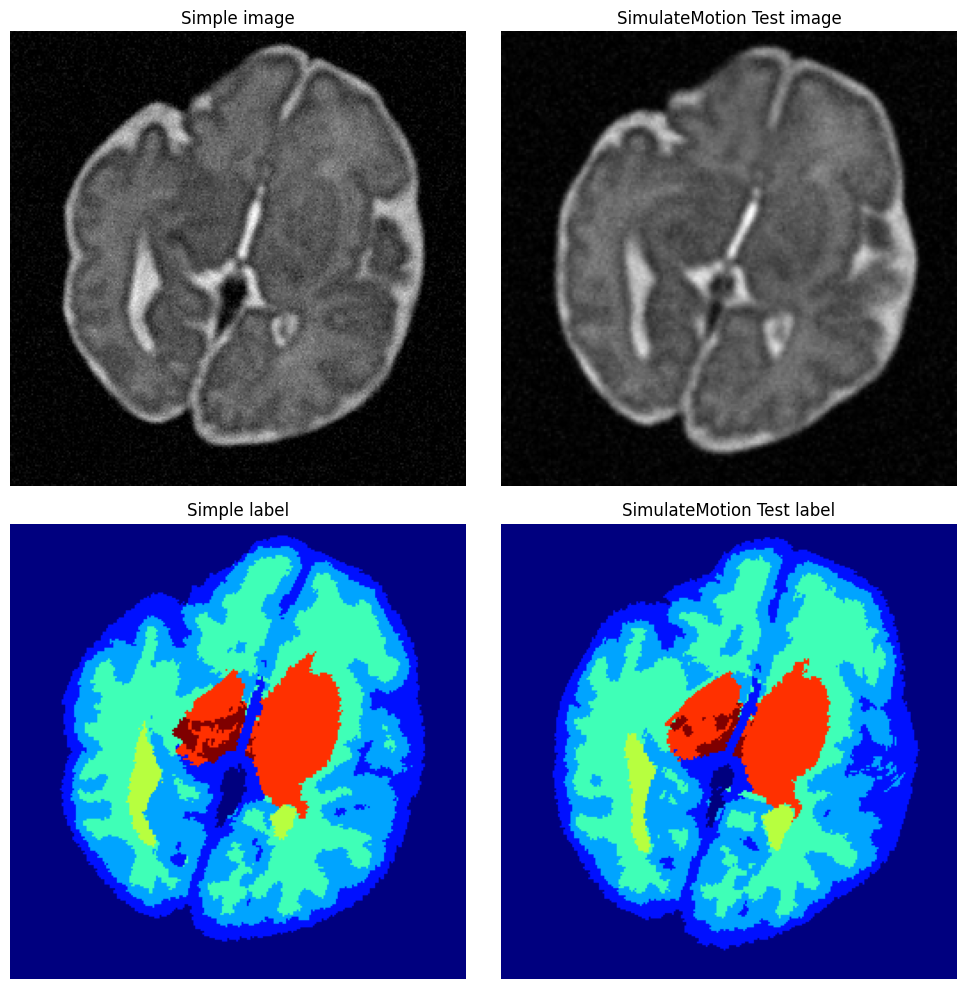

5 {'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.76341524072221, 'slice_thickness': 4.190271535650492, 'gap': 4.439262111206517, 'nstacks': 2, 'smooth_volume_on': False, 'rm_slices_on': True, 'rm_slices_ratio': 0.1529158880961557, 'misreg_stack_on': [False, False], 'misreg_slice_on': False, 'merge_volume_on': False, 'ngaussians_merge': 2}}
Simple image generation time: 0.9357635974884033
SimulateMotion image generation time: 2.3399574756622314


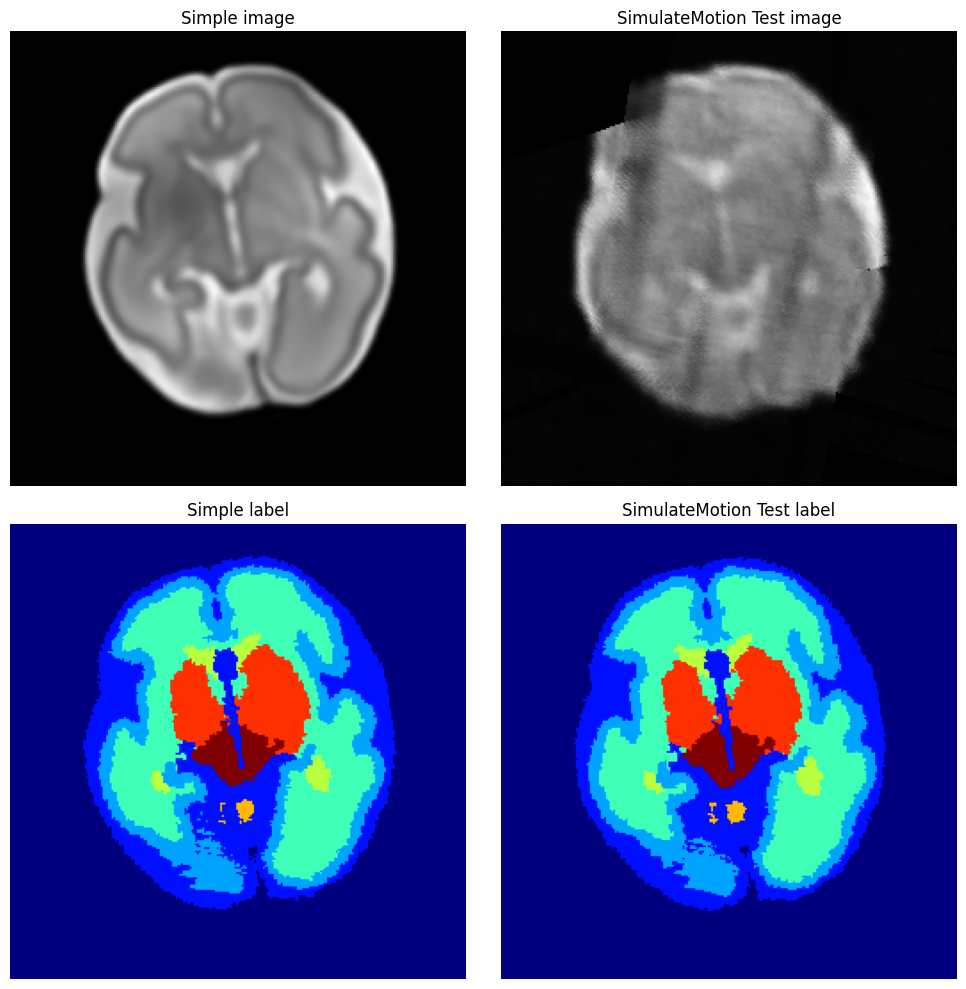

6 {'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.9978032489851302, 'slice_thickness': 3.0571278833597395, 'gap': 1.8601118262376988, 'nstacks': 3, 'smooth_volume_on': False, 'rm_slices_on': True, 'rm_slices_ratio': 0.39052140713412353, 'misreg_stack_on': [True, False, False], 'misreg_slice_on': False, 'merge_volume_on': False, 'ngaussians_merge': 2}}
Simple image generation time: 0.913733959197998
SimulateMotion image generation time: 3.5707085132598877


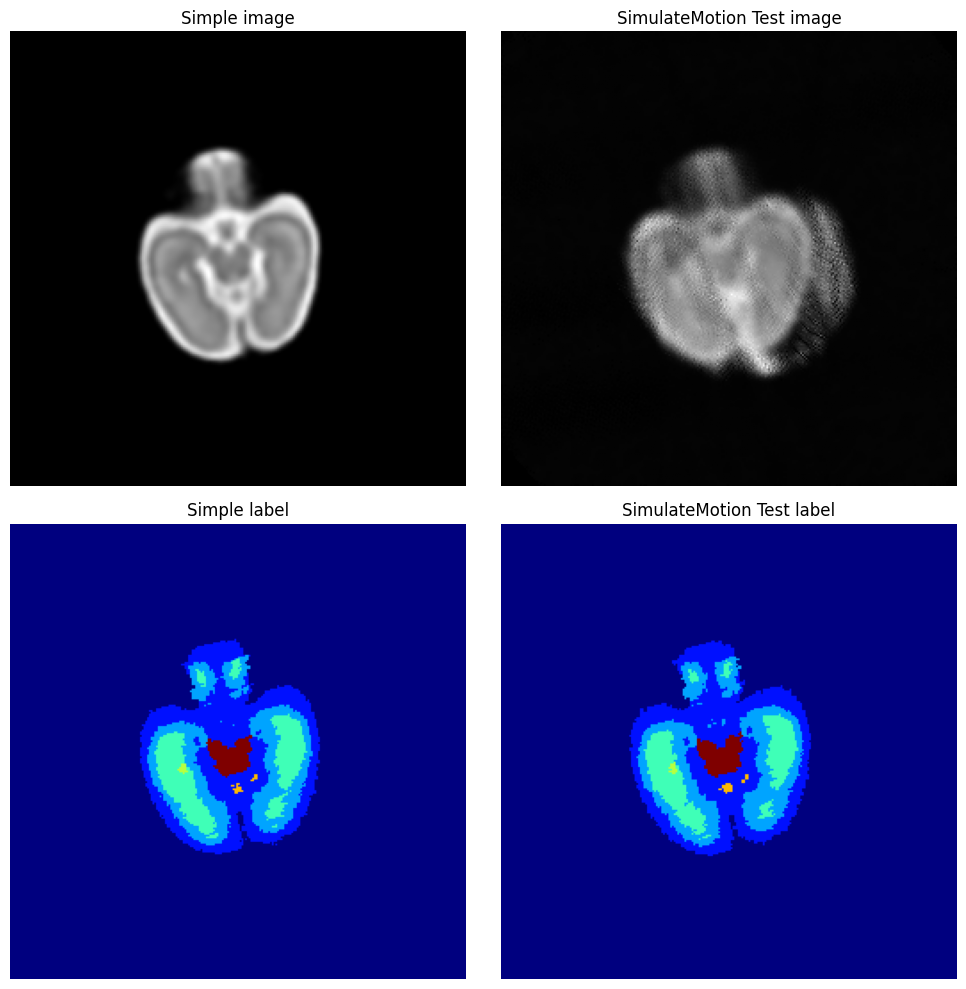

7 {'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.7217459414049099, 'slice_thickness': 1.798791832000528, 'gap': 1.8913026969841598, 'nstacks': 3, 'smooth_volume_on': True, 'rm_slices_on': True, 'rm_slices_ratio': 0.2263516248831579, 'misreg_stack_on': [False, False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 2}}
Simple image generation time: 0.7023446559906006
SimulateMotion image generation time: 1.8488969802856445


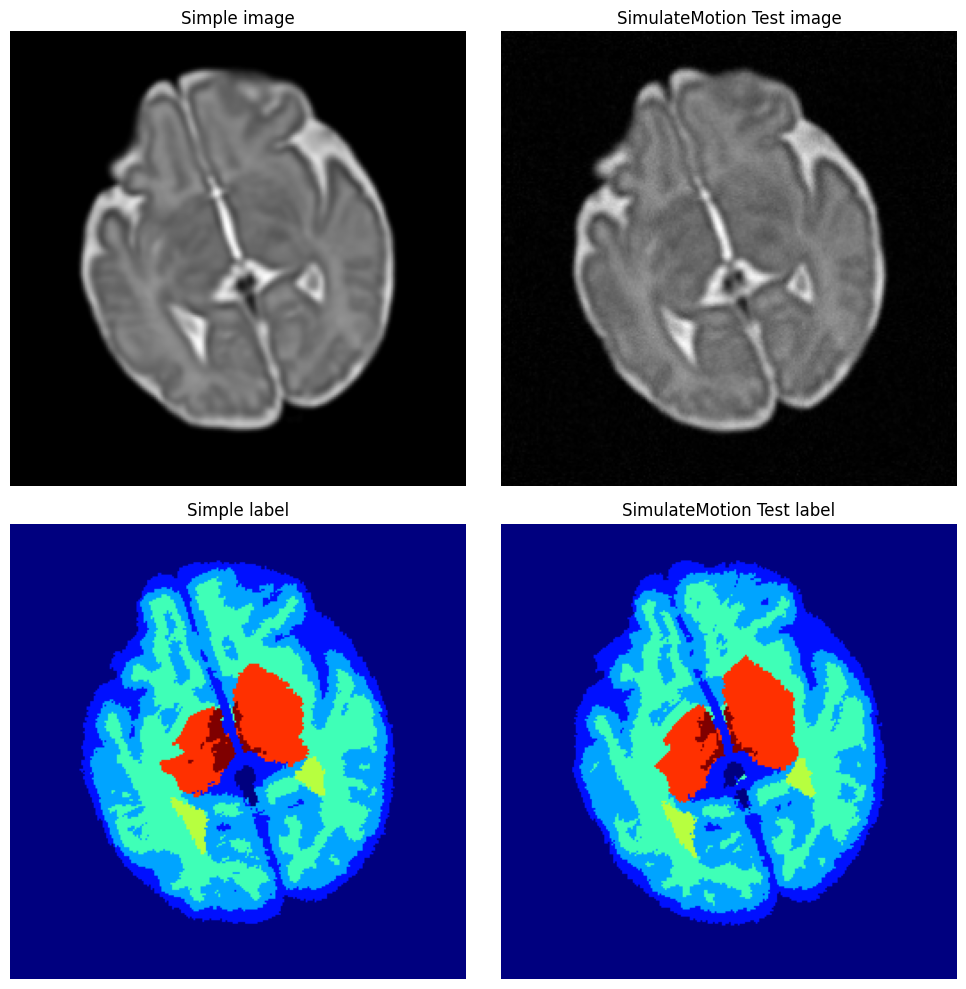

8 {'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.8758404272392466, 'slice_thickness': 2.4770768455656342, 'gap': 3.4977889632684844, 'nstacks': 5, 'smooth_volume_on': False, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, False, False, False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 3}}
Simple image generation time: 0.46824169158935547
SimulateMotion image generation time: 1.482198715209961


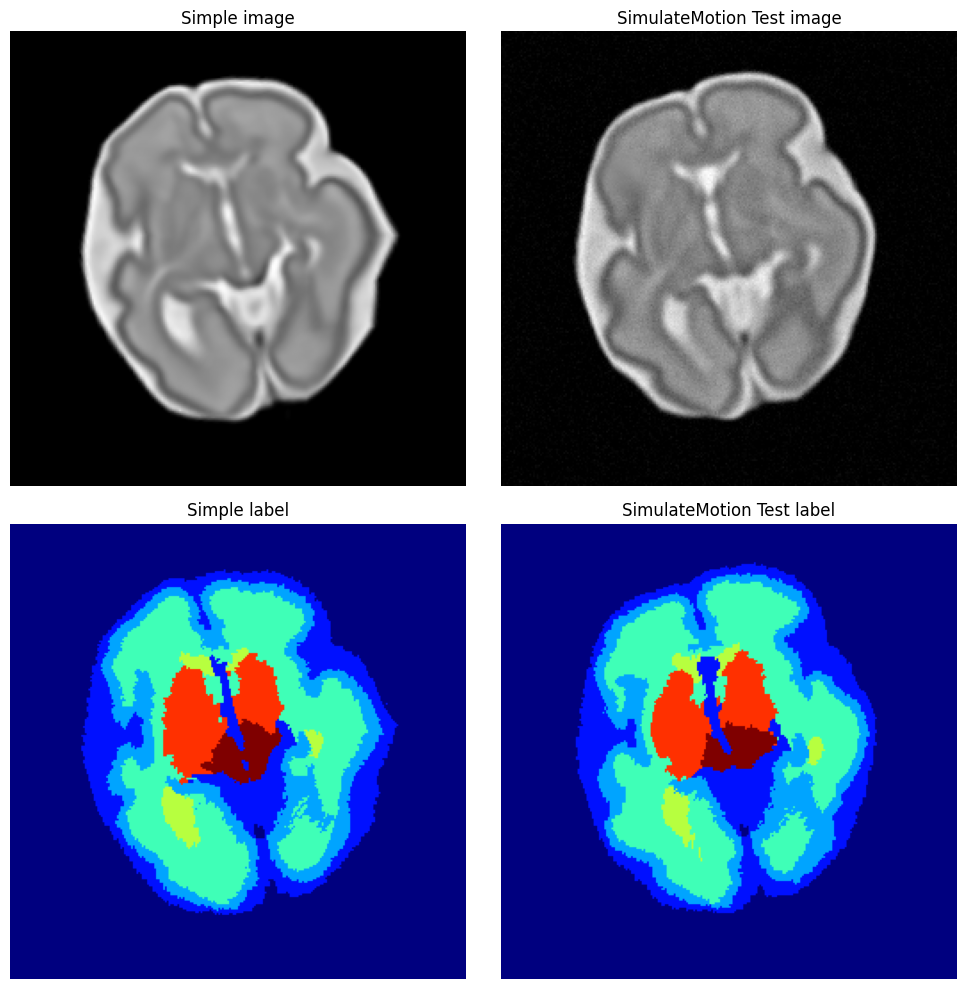

9 {'simulate_motion': {'resolution_recon': 0.5, 'resolution_slice': 0.7020894134807739, 'slice_thickness': 4.096407172663762, 'gap': 1.6519989704836289, 'nstacks': 4, 'smooth_volume_on': True, 'rm_slices_on': False, 'rm_slices_ratio': None, 'misreg_stack_on': [False, True, False, False], 'misreg_slice_on': False, 'merge_volume_on': True, 'ngaussians_merge': 2}}
Simple image generation time: 0.9974563121795654
SimulateMotion image generation time: 3.4276957511901855


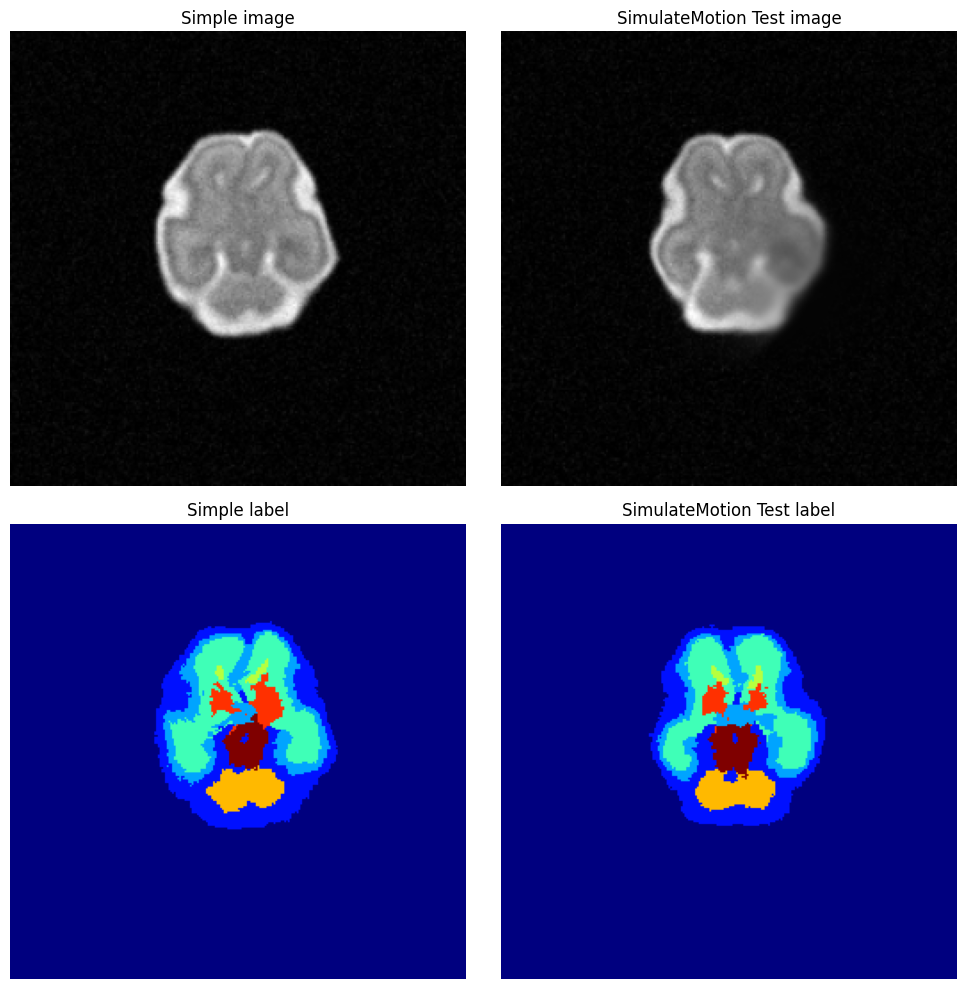

In [8]:
# Instantiate ScannerParams
scanner_params = ScannerParams(
    resolution_slice_fac_min=0.5,
    resolution_slice_fac_max=2,
    resolution_slice_max=1.5,
    slice_thickness_min=1.5,
    slice_thickness_max=5,
    gap_min=1.5,
    gap_max=4.5,
    min_num_stack=2,
    max_num_stack=6,
    max_num_slices=250,
    noise_sigma_min=0,
    noise_sigma_max=0.1,
    TR_min=1,
    TR_max=2,
    prob_gamma=0.1,
    gamma_std=0.05,
    prob_void=0.2,
    slice_size=None,
    restrict_transform=False,
    txy=3.0,
)

# Instantiate ReconParams
recon_params = ReconParams(
    prob_misreg_slice=0.1,
    slices_misreg_ratio=0.1,
    prob_misreg_stack=0.1,
    txy=3.0,
    prob_merge=0.8,
    merge_ngaussians_min=2,
    merge_ngaussians_max=4,
    prob_smooth=0.2,
    prob_rm_slices=0.3,
    rm_slices_min=0.1,
    rm_slices_max=0.4,
)

# Instantiate SimulateMotion
simulate_motion = SimulateMotion(
    prob=1, scanner_params=scanner_params, recon_params=recon_params
)


# SR ARTIFACTS CLASSES

# Instantiate BlurCortex
test_name = "SimulateMotion"
# Instantiate SimulatedBoundaries

test_gen = FetalSynthGen(
    shape=(256, 256, 256),
    resolution=(0.5, 0.5, 0.5),
    device="cuda:0",
    intensity_generator=intensity_generator,
    spatial_deform=spatial_deform,
    resampler=resampler,
    bias_field=bias_field,
    noise=noise,
    gamma=gamma,
    simulate_motion=simulate_motion,
)

test_dataset = FetalSynthDataset(
    bids_path="./../data",
    generator=test_gen,
    seed_path=None,#"./../data/derivatives/seeds",
    load_image=True,
    image_as_intensity=True,
    sub_list=None,
)

import nibabel as nib
for j in range(3):
    for i in range(3):
        simple_sample = simple_real_ds.sample_with_meta(i)
        test_sample = test_dataset.sample_with_meta(
            i, simple_sample["generation_params"]
        )
        print(3*j+i+1, test_sample['generation_params']['artifacts'])

        plot_sidebyside(simple_sample, test_sample, test_name)
        og_im = simple_sample["image"].squeeze().cpu().numpy()
        te_im = test_sample["image"].squeeze().cpu().numpy()
        # nib.save(nib.Nifti1Image(og_im, np.eye(4)), f'og_im_{3*j+i+1}.nii.gz')
        # nib.save(nib.Nifti1Image(te_im, np.eye(4)), f"te_im_{3*j+i+1}.nii.gz")